In [698]:
import pandas as pd
import seaborn as sns
import hvplot.pandas
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
import numpy as np
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostClassifier
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold
import xgboost
from scipy.stats import chi2_contingency, shapiro, mannwhitneyu, ttest_ind
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_recall_curve, average_precision_score, auc
from sklearn.metrics import precision_score, recall_score, f1_score, brier_score_loss
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer
from statistics import mean
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing

In [718]:
def prepare_data(df):
    
    # Eksik değerleri en çok kullanılan ile doldur.
    df['Embarked'].fillna(df['Embarked'].mode()[0], inplace=True)
    # Eksik yaş değerlerini veri setinin yaş ortalaması ile
    df['Age'].fillna(df['Age'].median(), inplace=True)
    # Eksik ücret değerlerini veri setinin ücret ortalaması ile
    df['Fare'].fillna(df['Fare'].median(), inplace=True)
    
    # Age, SibSp, Parch, Fare verilerini 0 ile 1 arasında ölçeklendir.
    scaler = MinMaxScaler()
    df[['Age','SibSp','Parch','Fare']] = scaler.fit_transform(df[['Age','SibSp','Parch','Fare']])
    
    # Cinsiyetleri 0 ve 1 olarak değiştir.
    df['Sex'] = df['Sex'].map({'female':0,'male':1}).astype(int)
    
    # Class sütununa One hot encoding uygula 
    df_class = pd.get_dummies(df['Pclass'],prefix='Class')
    df[df_class.columns] = df_class
    
    # Biniş limanına One hot encoding uygula.
    df_emb = pd.get_dummies(df['Embarked'],prefix='Emb')
    df[df_emb.columns] = df_emb
    
    # Ad sütunundan başlıkları çıkar ve yeni sütunu doldur.
    df['Title'] = df['Name'].map(lambda x: get_title(x))
    # Replace titles with Mr, Mrs or Miss
    df['Title'] = df.apply(replace_titles, axis=1)
    # Dönüştüren başlıklar için One hot encoding uygula.
    df_title = pd.get_dummies(df['Title'],prefix='Title')
    df[df_title.columns] = df_title
    
    return

In [719]:
pd.pandas.set_option('display.max_columns', None)

In [720]:
df = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

In [721]:
prepare_data(df)
prepare_data(df_test)

In [722]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Class_1,Class_2,Class_3,Emb_C,Emb_Q,Emb_S,Title,Title_Master,Title_Miss,Title_Mr,Title_Mrs
0,1,0,3,"Braund, Mr. Owen Harris",1,0.271174,0.125,0.0,A/5 21171,0.014151,NaN,S,0,0,1,0,0,1,Mr,0,0,1,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,0.472229,0.125,0.0,PC 17599,0.139136,C85,C,1,0,0,1,0,0,Mrs,0,0,0,1
2,3,1,3,"Heikkinen, Miss. Laina",0,0.321438,0.000,0.0,STON/O2. 3101282,0.015469,NaN,S,0,0,1,0,0,1,Miss,0,1,0,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,0.434531,0.125,0.0,113803,0.103644,C123,S,1,0,0,0,0,1,Mrs,0,0,0,1
4,5,0,3,"Allen, Mr. William Henry",1,0.434531,0.000,0.0,373450,0.015713,NaN,S,0,0,1,0,0,1,Mr,0,0,1,0


In [712]:
df_test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Class_1,Class_2,Class_3,Emb_C,Emb_Q,Emb_S,Title
0,892,3,"Kelly, Mr. James",1,0.452723,0.000,0.000000,330911,0.015282,NaN,Q,0,0,1,0,1,0,Mr
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",0,0.617566,0.125,0.000000,363272,0.013663,NaN,S,0,0,1,0,0,1,Mrs
2,894,2,"Myles, Mr. Thomas Francis",1,0.815377,0.000,0.000000,240276,0.018909,NaN,Q,0,1,0,0,1,0,Mr
3,895,3,"Wirz, Mr. Albert",1,0.353818,0.000,0.000000,315154,0.016908,NaN,S,0,0,1,0,0,1,Mr
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",0,0.287881,0.125,0.111111,3101298,0.023984,NaN,S,0,0,1,0,0,1,Mrs


In [723]:
df_test.drop(columns=['Name', 'Pclass', 'Ticket', 'Cabin', 'Embarked', 'Title'], inplace=True)
df.drop(columns=['Name', 'Pclass', 'Ticket', 'Cabin', 'Embarked', 'Title'], inplace=True)

In [724]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   891 non-null    int64  
 1   Survived      891 non-null    int64  
 2   Sex           891 non-null    int32  
 3   Age           891 non-null    float64
 4   SibSp         891 non-null    float64
 5   Parch         891 non-null    float64
 6   Fare          891 non-null    float64
 7   Class_1       891 non-null    uint8  
 8   Class_2       891 non-null    uint8  
 9   Class_3       891 non-null    uint8  
 10  Emb_C         891 non-null    uint8  
 11  Emb_Q         891 non-null    uint8  
 12  Emb_S         891 non-null    uint8  
 13  Title_Master  891 non-null    uint8  
 14  Title_Miss    891 non-null    uint8  
 15  Title_Mr      891 non-null    uint8  
 16  Title_Mrs     891 non-null    uint8  
dtypes: float64(4), int32(1), int64(2), uint8(10)
memory usage: 54.1 KB


In [407]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


In [408]:
df.duplicated().sum()

0

In [409]:
df_test.duplicated().sum()

0

In [410]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [411]:
df_test.isnull().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

In [412]:
df.drop(columns='Cabin', inplace=True)
df_test.drop(columns='Cabin', inplace=True)

In [413]:
df[df["Age"].notnull()]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S
...,...,...,...,...,...,...,...,...,...,...,...
885,886,0,3,"Rice, Mrs. William (Margaret Norton)",female,39.0,0,5,382652,29.1250,Q
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C


In [414]:
mean_age = df[df["Age"].notnull()].Age.mean()

In [415]:
df['Age'] = df['Age'].fillna(mean_age)

In [416]:
df['Embarked'].value_counts()

S    644
C    168
Q     77
Name: Embarked, dtype: int64

In [417]:
df['Embarked'] = df['Embarked'].fillna('S')

In [418]:
mean_age_test = df_test[df_test["Age"].notnull()].Age.mean()

In [419]:
df_test['Age'] = df_test['Age'].fillna(mean_age_test)

In [420]:
df_test['Fare'] = df_test['Fare'].fillna(df_test[df_test["Fare"].notnull()].Fare.mean())

In [421]:
df.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

In [422]:
df_test.isnull().sum()

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

In [423]:
df.Pclass.unique()

array([3, 1, 2], dtype=int64)

In [424]:
df.SibSp.unique()

array([1, 0, 3, 4, 2, 5, 8], dtype=int64)

df = pd.get_dummies(df, columns = ['Pclass'])
df_test = pd.get_dummies(df_test, columns = ['Pclass'])

In [425]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S


In [426]:
def get_title(name):
    if '.' in name:
        return name.split(',')[1].split('.')[0].strip()
    else:
        return 'Unknown'

In [430]:
def replace_titles(x):
    title = x['Title']
    if title in ['Capt', 'Col', 'Don', 'Jonkheer', 'Major', 'Rev', 'Sir']:
        return 'Mr'
    elif title in ['the Countess', 'Mme', 'Lady']:
        return 'Mrs'
    elif title in ['Mlle', 'Ms']:
        return 'Miss'
    elif title =='Dr':
        if x['Sex']=='male':
            return 'Mr'
        else:
            return 'Mrs'
    else:
        return title

In [431]:
df['Title'] = df['Name'].map(lambda x: get_title(x))
    # Replace titles with Mr, Mrs or Miss
df['Title'] = df.apply(replace_titles, axis=1)

In [433]:
df_test['Title'] = df_test['Name'].map(lambda x: get_title(x))
    # Replace titles with Mr, Mrs or Miss
df_test['Title'] = df_test.apply(replace_titles, axis=1)

In [435]:
df.drop(columns='Name', inplace=True)
df_test.drop(columns='Name', inplace=True)

In [436]:
df.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Title
0,1,0,3,male,22.0,1,0,A/5 21171,7.2500,S,Mr
1,2,1,1,female,38.0,1,0,PC 17599,71.2833,C,Mrs
2,3,1,3,female,26.0,0,0,STON/O2. 3101282,7.9250,S,Miss
3,4,1,1,female,35.0,1,0,113803,53.1000,S,Mrs
4,5,0,3,male,35.0,0,0,373450,8.0500,S,Mr


In [437]:
df['Sex']= LabelEncoder().fit_transform(df['Sex'])
df_test['Sex']= LabelEncoder().fit_transform(df_test['Sex'])

In [438]:
df = pd.get_dummies(df, columns = ['Embarked'])
df_test = pd.get_dummies(df_test, columns = ['Embarked'])

df = pd.get_dummies(df, columns = ['Title'])
df_test = pd.get_dummies(df_test, columns = ['Title'])

In [440]:
df = pd.get_dummies(df, columns = ['Pclass'])
df_test = pd.get_dummies(df_test, columns = ['Pclass'])

In [441]:
df.head()

,PassengerId,Survived,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked_C,Embarked_Q,Embarked_S,Title_Master,Title_Miss,Title_Mr,Title_Mrs,Pclass_1,Pclass_2,Pclass_3
0,1,0,1,22.0,1,0,A/5 21171,7.2500,0,0,1,0,0,1,0,0,0,1
1,2,1,0,38.0,1,0,PC 17599,71.2833,1,0,0,0,0,0,1,1,0,0
2,3,1,0,26.0,0,0,STON/O2. 3101282,7.9250,0,0,1,0,1,0,0,0,0,1
3,4,1,0,35.0,1,0,113803,53.1000,0,0,1,0,0,0,1,1,0,0
4,5,0,1,35.0,0,0,373450,8.0500,0,0,1,0,0,1,0,0,0,1


In [442]:
df.drop(columns='Ticket', inplace=True)
df_test.drop(columns='Ticket', inplace=True)

In [443]:
df["Age"]=preprocessing.minmax_scale(df.Age)
df["Fare"]=preprocessing.minmax_scale(df.Fare)

df_test["Age"]=preprocessing.minmax_scale(df_test.Age)
df_test["Fare"]=preprocessing.minmax_scale(df_test.Fare)

In [444]:
df_test.head()

,PassengerId,Sex,Age,SibSp,Parch,Fare,Embarked_C,Embarked_Q,Embarked_S,Title_Dona,Title_Master,Title_Miss,Title_Mr,Title_Mrs,Pclass_1,Pclass_2,Pclass_3
0,892,1,0.452723,0,0,0.015282,0,1,0,0,0,0,1,0,0,0,1
1,893,0,0.617566,1,0,0.013663,0,0,1,0,0,0,0,1,0,0,1
2,894,1,0.815377,0,0,0.018909,0,1,0,0,0,0,1,0,0,1,0
3,895,1,0.353818,0,0,0.016908,0,0,1,0,0,0,1,0,0,0,1
4,896,0,0.287881,1,1,0.023984,0,0,1,0,0,0,0,1,0,0,1


# Models

In [970]:
df

,PassengerId,Survived,Sex,Age,SibSp,Parch,Fare,Class_1,Class_2,Class_3,Emb_C,Emb_Q,Emb_S,Title_Master,Title_Miss,Title_Mr,Title_Mrs
0,1,0,1,0.271174,0.125,0.000000,0.014151,0,0,1,0,0,1,0,0,1,0
1,2,1,0,0.472229,0.125,0.000000,0.139136,1,0,0,1,0,0,0,0,0,1
2,3,1,0,0.321438,0.000,0.000000,0.015469,0,0,1,0,0,1,0,1,0,0
3,4,1,0,0.434531,0.125,0.000000,0.103644,1,0,0,0,0,1,0,0,0,1
4,5,0,1,0.434531,0.000,0.000000,0.015713,0,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,1,0.334004,0.000,0.000000,0.025374,0,1,0,0,0,1,0,0,1,0
887,888,1,0,0.233476,0.000,0.000000,0.058556,1,0,0,0,0,1,0,1,0,0
888,889,0,0,0.346569,0.125,0.333333,0.045771,0,0,1,0,0,1,0,1,0,0
889,890,1,1,0.321438,0.000,0.000000,0.058556,1,0,0,1,0,0,0,0,1,0


In [971]:
x = df.drop(["PassengerId", "Survived"], axis=1)
y = df["Survived"]

In [972]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=3)

## Random Forest

In [973]:
rf= RandomForestClassifier()
rf.fit(x_train, y_train)

RandomForestClassifier()

In [974]:
rf_predicts= rf.predict(x_test)

In [975]:
rf_cm= confusion_matrix(y_test, rf_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_cm)


Random Forest Confusion Matrix:

[[151  29]
 [ 31  84]]


In [976]:
target_names = ['0', '1']
print(classification_report(y_test, rf_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.83      0.84      0.83       180
           1       0.74      0.73      0.74       115

    accuracy                           0.80       295
   macro avg       0.79      0.78      0.79       295
weighted avg       0.80      0.80      0.80       295



In [977]:
cv  = StratifiedKFold(n_splits=7, shuffle=True, random_state=3)

In [978]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_f1 = mean(scor)
print("Random Forest doğrulanmış f1 skoru:", rf_f1)

Random Forest doğrulanmış f1 skoru: 0.7324117536396137


In [979]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_accuracy = mean(scor)
print("Random Forest doğrulanmış accuracy skoru:", rf_accuracy)

Random Forest doğrulanmış accuracy skoru: 0.8013129218222722


In [980]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_brier = -1*mean(scor)
print("Random Forest doğrulanmış brier skoru:", rf_brier)

Random Forest doğrulanmış brier skoru: 0.1419576808838504


In [981]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = -1*[]
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_roc_auc = mean(scor)
print("Random Forest doğrulanmış roc-auc skoru:", rf_roc_auc)

Random Forest doğrulanmış roc-auc skoru: 0.78793783823169


In [982]:
rf_class1_probs = rf.predict_proba(x_test)[:, 1]

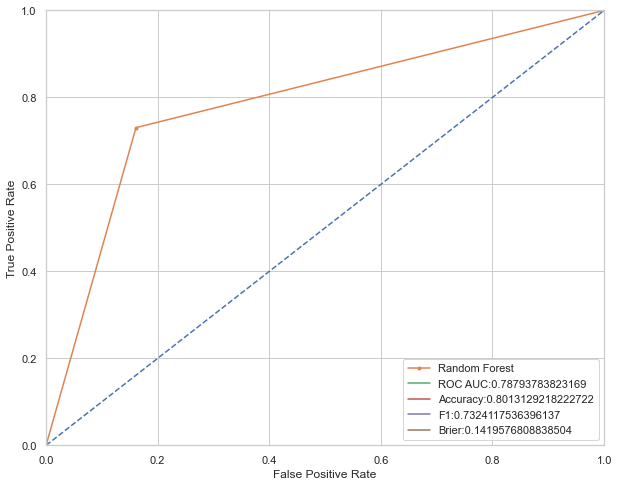

In [983]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, rf_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Random Forest')
plt.plot(0, label = 'ROC AUC:'+str(rf_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(rf_accuracy))
plt.plot(0, label = 'F1:'+str(rf_f1))
plt.plot(0, label = 'Brier:'+str(rf_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [984]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    rf_thresh_predicts = rf_class1_probs > threshold
    precision = precision_score(y_test, rf_thresh_predicts)
    recall = recall_score(y_test, rf_thresh_predicts)
    f1 = f1_score(y_test, rf_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.435, Completeness = 0.957 | F1 = 0.598
Threshold = 0.01 | Accuracy = 0.448, Completeness = 0.939 | F1 = 0.607
Threshold = 0.02 | Accuracy = 0.459, Completeness = 0.930 | F1 = 0.615
Threshold = 0.03 | Accuracy = 0.476, Completeness = 0.930 | F1 = 0.629
Threshold = 0.04 | Accuracy = 0.479, Completeness = 0.913 | F1 = 0.629
Threshold = 0.05 | Accuracy = 0.500, Completeness = 0.896 | F1 = 0.642
Threshold = 0.06 | Accuracy = 0.518, Completeness = 0.896 | F1 = 0.656
Threshold = 0.07 | Accuracy = 0.528, Completeness = 0.887 | F1 = 0.662
Threshold = 0.08 | Accuracy = 0.540, Completeness = 0.878 | F1 = 0.669
Threshold = 0.09 | Accuracy = 0.540, Completeness = 0.878 | F1 = 0.669
Threshold = 0.10 | Accuracy = 0.552, Completeness = 0.870 | F1 = 0.676
Threshold = 0.11 | Accuracy = 0.556, Completeness = 0.861 | F1 = 0.676
Threshold = 0.12 | Accuracy = 0.566, Completeness = 0.861 | F1 = 0.683
Threshold = 0.13 | Accuracy = 0.564, Completeness = 0.843 | F1 = 0.676
Thresh

In [985]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    rf_thresh_predicts = rf_class1_probs > threshold
    f1 = f1_score(y_test, rf_thresh_predicts)
    if f1_list.max() == f1:
        rf_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", rf_best_threshold)

Maximum f1 score is: 0.751 and best threshold is: 0.45


In [986]:
def custom_predict(X, threshold):
    
    return (rf_class1_probs > threshold).astype(int)
    
    
rf_thresh_predicts = custom_predict(X = x_test, threshold = rf_best_threshold) 

In [987]:
rf_thresh_cm= confusion_matrix(y_test, rf_thresh_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_thresh_cm)


Random Forest Confusion Matrix:

[[147  33]
 [ 26  89]]


In [988]:
print(classification_report(y_test, rf_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.85      0.82      0.83       180
           1       0.73      0.77      0.75       115

    accuracy                           0.80       295
   macro avg       0.79      0.80      0.79       295
weighted avg       0.80      0.80      0.80       295



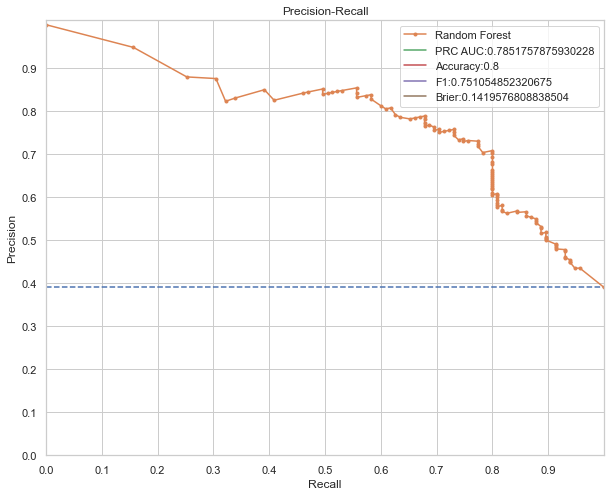

In [989]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, rf_class1_probs)
rf_thresh_f1, rf_prc_auc = f1_score(y_test, rf_thresh_predicts), auc(recall, precision)
rf_thresh_accuracy = accuracy_score(y_test, rf_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Random Forest')
plt.plot(0,label='PRC AUC:'+str(rf_prc_auc))
plt.plot(0,label='Accuracy:'+str(rf_thresh_accuracy))
plt.plot(0,label='F1:'+str(rf_thresh_f1))
plt.plot(0,label='Brier:'+str(rf_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [990]:
rf_params = {'bootstrap': ['True'],
             "criterion":["gini", "entropy"], 
             "max_depth": [2,5,8,10],
             "min_samples_leaf":[1, 2, 3, 5, 10],
            "max_features": [2,5,8, 'auto'],
            "n_estimators": [10,500,1000],
            "min_samples_split": [2,5,10]}

In [991]:
rf_tuned = RandomizedSearchCV(rf, 
                           rf_params, 
                           cv = cv,
                           n_iter = 200,
                           scoring = 'f1',
                           n_jobs = -1, 
                           verbose = 2) 

In [992]:
rf_tuned.fit(x_train, y_train)

Fitting 7 folds for each of 200 candidates, totalling 1400 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=7, random_state=3, shuffle=True),
                   estimator=RandomForestClassifier(), n_iter=200, n_jobs=-1,
                   param_distributions={'bootstrap': ['True'],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 5, 8, 10],
                                        'max_features': [2, 5, 8, 'auto'],
                                        'min_samples_leaf': [1, 2, 3, 5, 10],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 500, 1000]},
                   scoring='f1', verbose=2)

In [993]:
print("En iyi parametreler: " + str(rf_tuned.best_params_))

En iyi parametreler: {'n_estimators': 1000, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 8, 'max_depth': 10, 'criterion': 'gini', 'bootstrap': 'True'}


In [994]:
rf_tuned= RandomForestClassifier(bootstrap=rf_tuned.best_params_["bootstrap"],
                                 max_depth=rf_tuned.best_params_["max_depth"],
                                max_features=rf_tuned.best_params_["max_features"],
                                min_samples_split=rf_tuned.best_params_["min_samples_split"],
                                min_samples_leaf=rf_tuned.best_params_["min_samples_leaf"],
                                criterion=rf_tuned.best_params_["criterion"],
                                n_estimators=rf_tuned.best_params_["n_estimators"])

In [995]:
rf_tuned.fit(x_train, y_train)

rf_tuned_predicts= rf_tuned.predict(x_test)

rf_tuned_class1_probs =rf_tuned.predict_proba(x_test)[:, 1]

In [996]:
rf_tuned_cm= confusion_matrix(y_test, rf_tuned_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_tuned_cm)


Random Forest Confusion Matrix:

[[150  30]
 [ 34  81]]


In [997]:
print(classification_report(y_test, rf_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.82      0.83      0.82       180
           1       0.73      0.70      0.72       115

    accuracy                           0.78       295
   macro avg       0.77      0.77      0.77       295
weighted avg       0.78      0.78      0.78       295



In [998]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_f1 = mean(scor)
print("Random Forest doğrulanmış f1 skoru:", rf_tuned_f1)

Random Forest doğrulanmış f1 skoru: 0.7638258426169213


In [999]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_accuracy = mean(scor)
print("Random Forest doğrulanmış accuracy skoru:", rf_tuned_accuracy)

Random Forest doğrulanmış accuracy skoru: 0.831609427727784


In [1000]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_brier = -1*mean(scor)
print("Random Forest doğrulanmış brier skoru:", rf_tuned_brier)

Random Forest doğrulanmış brier skoru: 0.1256564348693242


In [1001]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_roc_auc = mean(scor)
print("Random Forest doğrulanmış roc-auc skoru:", rf_tuned_roc_auc)

Random Forest doğrulanmış roc-auc skoru: 0.80771506248208


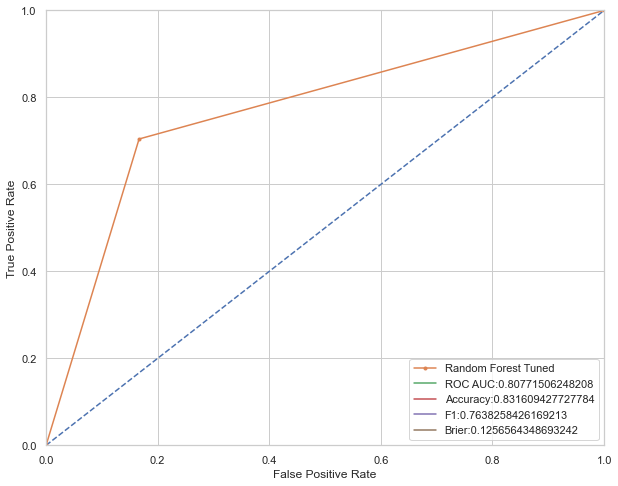

In [1002]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, rf_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Random Forest Tuned')
plt.plot(0, label = 'ROC AUC:'+str(rf_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(rf_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(rf_tuned_f1))
plt.plot(0, label = 'Brier:'+str(rf_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1003]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    rf_tuned_thresh_predicts = rf_tuned_class1_probs > threshold
    precision = precision_score(y_test, rf_tuned_thresh_predicts)
    recall = recall_score(y_test, rf_tuned_thresh_predicts)
    f1 = f1_score(y_test, rf_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.392, Completeness = 1.000 | F1 = 0.564
Threshold = 0.02 | Accuracy = 0.395, Completeness = 1.000 | F1 = 0.567
Threshold = 0.03 | Accuracy = 0.407, Completeness = 0.991 | F1 = 0.577
Threshold = 0.04 | Accuracy = 0.417, Completeness = 0.965 | F1 = 0.583
Threshold = 0.05 | Accuracy = 0.414, Completeness = 0.939 | F1 = 0.574
Threshold = 0.06 | Accuracy = 0.426, Completeness = 0.930 | F1 = 0.585
Threshold = 0.07 | Accuracy = 0.438, Completeness = 0.922 | F1 = 0.594
Threshold = 0.08 | Accuracy = 0.447, Completeness = 0.913 | F1 = 0.600
Threshold = 0.09 | Accuracy = 0.455, Completeness = 0.913 | F1 = 0.607
Threshold = 0.10 | Accuracy = 0.459, Completeness = 0.913 | F1 = 0.610
Threshold = 0.11 | Accuracy = 0.473, Completeness = 0.913 | F1 = 0.623
Threshold = 0.12 | Accuracy = 0.500, Completeness = 0.913 | F1 = 0.646
Threshold = 0.13 | Accuracy = 0.512, Completeness = 0.913 | F1 = 0.656
Thresh

In [1004]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    rf_tuned_thresh_predicts = rf_tuned_class1_probs > threshold
    f1 = f1_score(y_test, rf_tuned_thresh_predicts)
    if f1_list.max() == f1:
        rf_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", rf_best_threshold)

Maximum f1 score is: 0.752 and best threshold is: 0.28


In [1005]:
def custom_predict(X, threshold):
    
    return (rf_tuned_class1_probs > threshold).astype(int)
    
    
rf_tuned_thresh_predicts = custom_predict(X = x_test, threshold = rf_best_threshold) 

In [1006]:
rf_tuned_thresh_cm= confusion_matrix(y_test, rf_tuned_thresh_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_tuned_thresh_cm)


Random Forest Confusion Matrix:

[[134  46]
 [ 18  97]]


In [1007]:
print(classification_report(y_test, rf_tuned_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.88      0.74      0.81       180
           1       0.68      0.84      0.75       115

    accuracy                           0.78       295
   macro avg       0.78      0.79      0.78       295
weighted avg       0.80      0.78      0.79       295



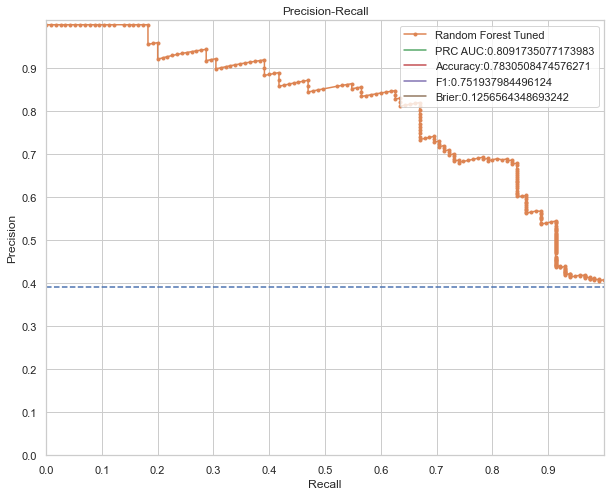

In [1008]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, rf_tuned_class1_probs)
rf_tuned_thresh_f1, rf_tuned_prc_auc = f1_score(y_test, rf_tuned_thresh_predicts), auc(recall, precision)
rf_tuned_thresh_accuracy = accuracy_score(y_test, rf_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Random Forest Tuned')
plt.plot(0,label='PRC AUC:'+str(rf_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(rf_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(rf_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(rf_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Bagging

In [1009]:
bag = BaggingClassifier().fit(x_train, y_train)

In [1010]:
bag_predicts= bag.predict(x_test)

In [1011]:
bag_cm= confusion_matrix(y_test, bag_predicts)
print("\nBagging Classifier Confusion Matrix:\n")
print(bag_cm)


Bagging Classifier Confusion Matrix:

[[147  33]
 [ 36  79]]


In [1012]:
print(classification_report(y_test, bag_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81       180
           1       0.71      0.69      0.70       115

    accuracy                           0.77       295
   macro avg       0.75      0.75      0.75       295
weighted avg       0.77      0.77      0.77       295



In [1013]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_f1 = mean(scor)
print("Bagging doğrulanmış f1 skoru:", bag_f1)

Bagging doğrulanmış f1 skoru: 0.7260900651837545


In [1014]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_accuracy = mean(scor)
print("Bagging doğrulanmış accuracy skoru:", bag_accuracy)

Bagging doğrulanmış accuracy skoru: 0.81087862064117


In [1015]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_brier = -1*mean(scor)
print("Bagging doğrulanmış brier skoru:", bag_brier)

Bagging doğrulanmış brier skoru: 0.1495790941169981


In [1016]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_roc_auc = mean(scor)
print("Bagging doğrulanmış roc-auc skoru:", bag_roc_auc)

Bagging doğrulanmış roc-auc skoru: 0.7871542543502309


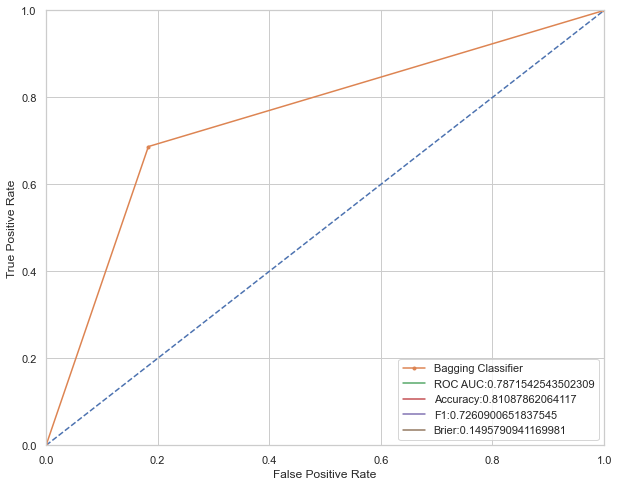

In [1017]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, bag_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Bagging Classifier')
plt.plot(0, label = 'ROC AUC:'+str(bag_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(bag_accuracy))
plt.plot(0, label = 'F1:'+str(bag_f1))
plt.plot(0, label = 'Brier:'+str(bag_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1018]:
bag_class1_probs = bag.predict_proba(x_test)[:, 1]

f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    bag_thresh_predicts = bag_class1_probs > threshold
    precision = precision_score(y_test, bag_thresh_predicts)
    recall = recall_score(y_test, bag_thresh_predicts)
    f1 = f1_score(y_test, bag_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.498, Completeness = 0.896 | F1 = 0.640
Threshold = 0.01 | Accuracy = 0.498, Completeness = 0.896 | F1 = 0.640
Threshold = 0.02 | Accuracy = 0.498, Completeness = 0.896 | F1 = 0.640
Threshold = 0.03 | Accuracy = 0.498, Completeness = 0.896 | F1 = 0.640
Threshold = 0.04 | Accuracy = 0.502, Completeness = 0.896 | F1 = 0.644
Threshold = 0.05 | Accuracy = 0.505, Completeness = 0.896 | F1 = 0.646
Threshold = 0.06 | Accuracy = 0.505, Completeness = 0.896 | F1 = 0.646
Threshold = 0.07 | Accuracy = 0.510, Completeness = 0.896 | F1 = 0.650
Threshold = 0.08 | Accuracy = 0.510, Completeness = 0.896 | F1 = 0.650
Threshold = 0.09 | Accuracy = 0.510, Completeness = 0.896 | F1 = 0.650
Threshold = 0.10 | Accuracy = 0.533, Completeness = 0.843 | F1 = 0.653
Threshold = 0.11 | Accuracy = 0.533, Completeness = 0.843 | F1 = 0.653
Threshold = 0.12 | Accuracy = 0.533, Completeness = 0.843 | F1 = 0.653
Threshold = 0.13 | Accuracy = 0.539, Completeness = 0.843 | F1 = 0.658
Thresh

In [1019]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    bag_thresh_predicts = bag_class1_probs > threshold
    f1 = f1_score(y_test, bag_thresh_predicts)
    if f1_list.max() == f1:
        bag_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", bag_best_threshold)

Maximum f1 score is: 0.712 and best threshold is: 0.34


In [1020]:
def custom_predict(X, threshold):
     
    return (bag_class1_probs > threshold).astype(int)
    
    
bag_thresh_predicts = custom_predict(X = x_test, threshold = bag_best_threshold) 

In [1021]:
bag_thresh_cm= confusion_matrix(y_test, bag_thresh_predicts)
print("\nBagging Classifier Confusion Matrix:\n")
print(bag_thresh_cm)


Bagging Classifier Confusion Matrix:

[[134  46]
 [ 26  89]]


In [1022]:
print(classification_report(y_test, bag_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.84      0.74      0.79       180
           1       0.66      0.77      0.71       115

    accuracy                           0.76       295
   macro avg       0.75      0.76      0.75       295
weighted avg       0.77      0.76      0.76       295



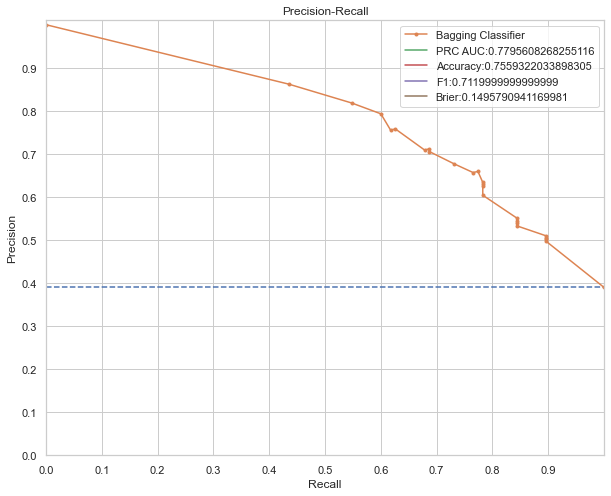

In [1023]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, bag_class1_probs)
bag_thresh_f1, bag_prc_auc = f1_score(y_test, bag_thresh_predicts), auc(recall, precision)
bag_thresh_accuracy = accuracy_score(y_test, bag_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Bagging Classifier')
plt.plot(0,label='PRC AUC:'+str(bag_prc_auc))
plt.plot(0,label='Accuracy:'+str(bag_thresh_accuracy))
plt.plot(0,label='F1:'+str(bag_thresh_f1))
plt.plot(0,label='Brier:'+str(bag_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [1024]:
bag_params = {
              "max_samples":[1,2,3,5,10,15],
              
            "max_features": [2,5,8, 10],
            "n_estimators": [10,100,250,500,1000]
            }

In [1025]:
bag_tuned = GridSearchCV(bag, 
                           bag_params, 
                           cv = cv,
                         
                           n_jobs = -1, 
                           verbose = 2,
                        scoring='f1') 

In [1026]:
bag_tuned.fit(x_train, y_train)

Fitting 7 folds for each of 120 candidates, totalling 840 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=3, shuffle=True),
             estimator=BaggingClassifier(), n_jobs=-1,
             param_grid={'max_features': [2, 5, 8, 10],
                         'max_samples': [1, 2, 3, 5, 10, 15],
                         'n_estimators': [10, 100, 250, 500, 1000]},
             scoring='f1', verbose=2)

In [1027]:
print("En iyi parametreler: " + str(bag_tuned.best_params_))

En iyi parametreler: {'max_features': 8, 'max_samples': 15, 'n_estimators': 500}


In [1028]:
bag_tuned= BaggingClassifier(max_samples=bag_tuned.best_params_["max_samples"],
                                max_features=bag_tuned.best_params_["max_features"],
                                n_estimators=bag_tuned.best_params_["n_estimators"])
bag_tuned.fit(x_train, y_train)

BaggingClassifier(max_features=8, max_samples=15, n_estimators=500)

In [1029]:
bag_tuned_predicts= bag_tuned.predict(x_test)

In [1030]:
bag_tuned_cm= confusion_matrix(y_test, bag_tuned_predicts)
print("\nBagging Classifier Confusion Matrix:\n")
print(bag_tuned_cm)


Bagging Classifier Confusion Matrix:

[[152  28]
 [ 33  82]]


In [1031]:
print(classification_report(y_test, bag_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.82      0.84      0.83       180
           1       0.75      0.71      0.73       115

    accuracy                           0.79       295
   macro avg       0.78      0.78      0.78       295
weighted avg       0.79      0.79      0.79       295



In [1032]:
bag_tuned_class1_probs =bag_tuned.predict_proba(x_test)[:, 1]

In [1033]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_tuned_f1 = mean(scor)
print("Bagging doğrulanmış f1 skoru:", bag_tuned_f1)

Bagging doğrulanmış f1 skoru: 0.7202557640779401


In [1034]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_tuned_accuracy = mean(scor)
print("Bagging doğrulanmış accuracy skoru:", bag_tuned_accuracy)

Bagging doğrulanmış accuracy skoru: 0.7906663034308212


In [1035]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_tuned_brier = -1*mean(scor)
print("Bagging doğrulanmış brier skoru:", bag_tuned_brier)

Bagging doğrulanmış brier skoru: 0.14991504787365495


In [1036]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(bag_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
bag_tuned_roc_auc = mean(scor)
print("Bagging doğrulanmış roc-auc skoru:", bag_tuned_roc_auc)

Bagging doğrulanmış roc-auc skoru: 0.7697987074924558


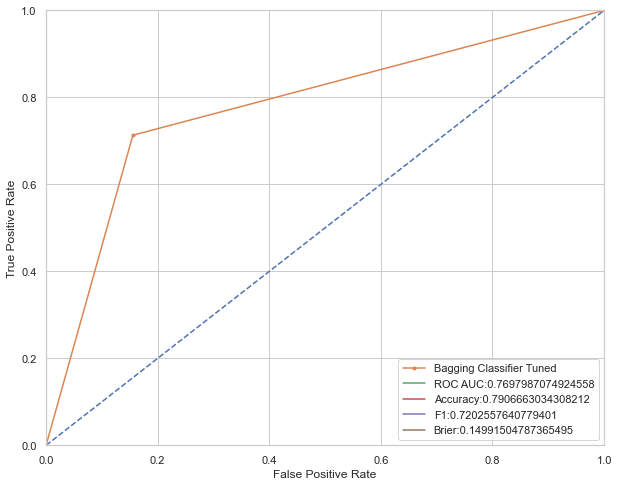

In [1037]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, bag_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Bagging Classifier Tuned')
plt.plot(0, label = 'ROC AUC:'+str(bag_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(bag_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(bag_tuned_f1))
plt.plot(0, label = 'Brier:'+str(bag_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1038]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    bag_tuned_thresh_predicts = bag_tuned_class1_probs > threshold
    precision = precision_score(y_test, bag_tuned_thresh_predicts)
    recall = recall_score(y_test, bag_tuned_thresh_predicts)
    f1 = f1_score(y_test, bag_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.02 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.03 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.04 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.05 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.06 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.07 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.08 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.09 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.10 | Accuracy = 0.389, Completeness = 0.965 | F1 = 0.555
Threshold = 0.11 | Accuracy = 0.415, Completeness = 0.957 | F1 = 0.579
Threshold = 0.12 | Accuracy = 0.437, Completeness = 0.930 | F1 = 0.594
Threshold = 0.13 | Accuracy = 0.451, Completeness = 0.930 | F1 = 0.608
Thresh

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precis

In [1039]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    bag_tuned_thresh_predicts = bag_tuned_class1_probs > threshold
    f1 = f1_score(y_test, bag_tuned_thresh_predicts)
    if f1_list.max() == f1:
        bag_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", bag_best_threshold)

Maximum f1 score is: 0.742 and best threshold is: 0.48


In [1040]:
def custom_predict(X, threshold):

    return (bag_tuned_class1_probs > threshold).astype(int)
    
    
bag_tuned_thresh_predicts = custom_predict(X = x_test, threshold = bag_best_threshold) 

In [1041]:
bag_tuned_thresh_cm= confusion_matrix(y_test, bag_tuned_thresh_predicts)
print("\nBagging Classifier Confusion Matrix:\n")
print(bag_tuned_thresh_cm)


Bagging Classifier Confusion Matrix:

[[144  36]
 [ 26  89]]


In [1042]:
print(classification_report(y_test, bag_tuned_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.85      0.80      0.82       180
           1       0.71      0.77      0.74       115

    accuracy                           0.79       295
   macro avg       0.78      0.79      0.78       295
weighted avg       0.79      0.79      0.79       295



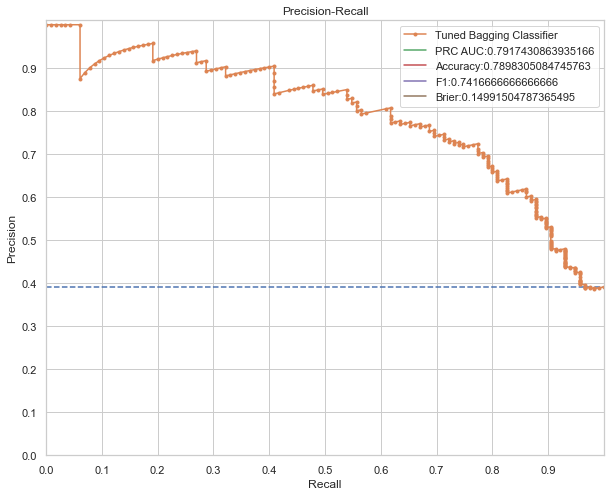

In [1043]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, bag_tuned_class1_probs)
bag_tuned_thresh_f1, bag_tuned_prc_auc = f1_score(y_test, bag_tuned_thresh_predicts), auc(recall, precision)
bag_tuned_thresh_accuracy = accuracy_score(y_test, bag_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Tuned Bagging Classifier')
plt.plot(0,label='PRC AUC:'+str(bag_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(bag_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(bag_tuned_thresh_f1))
plt.plot(0, label = 'Brier:'+str(bag_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Gradient Boosting

In [1044]:
gbc= GradientBoostingClassifier()
gbc.fit(x_train, y_train)

GradientBoostingClassifier()

In [1045]:
gbc_predicts= gbc.predict(x_test)
gbc_cm= confusion_matrix(y_test, gbc_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_cm)


Gradient Boosting Confusion Matrix:

[[153  27]
 [ 36  79]]


In [1046]:
print(classification_report(y_test, gbc_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83       180
           1       0.75      0.69      0.71       115

    accuracy                           0.79       295
   macro avg       0.78      0.77      0.77       295
weighted avg       0.78      0.79      0.78       295



In [1047]:
gbc_class1_probs = gbc.predict_proba(x_test)[:,1]

In [1048]:
cross_val_score(gbc, x, y, cv=cv, scoring='f1').mean()

0.7651536631200092

In [1049]:
gbc_f1 = cross_val_score(gbc, x, y, cv=cv, scoring='f1').mean()
print("Gradient Boosting doğrulanmış f1 skoru:", gbc_f1)

Gradient Boosting doğrulanmış f1 skoru: 0.7651536631200092


In [1050]:
gbc_accuracy = cross_val_score(gbc, x, y, cv=cv, scoring='accuracy').mean()
print("Gradient Boosting doğrulanmış accuracy skoru:", gbc_accuracy)

Gradient Boosting doğrulanmış accuracy skoru: 0.8316138217097863


In [1051]:
gbc_brier = -1*cross_val_score(gbc, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Gradient Boosting doğrulanmış brier skoru:", gbc_brier)

Gradient Boosting doğrulanmış brier skoru: 0.1259345589299967


In [1052]:
gbc_roc_auc = cross_val_score(gbc, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Gradient Boosting doğrulanmış roc-auc skoru:", gbc_roc_auc)

Gradient Boosting doğrulanmış roc-auc skoru: 0.8106270102282114


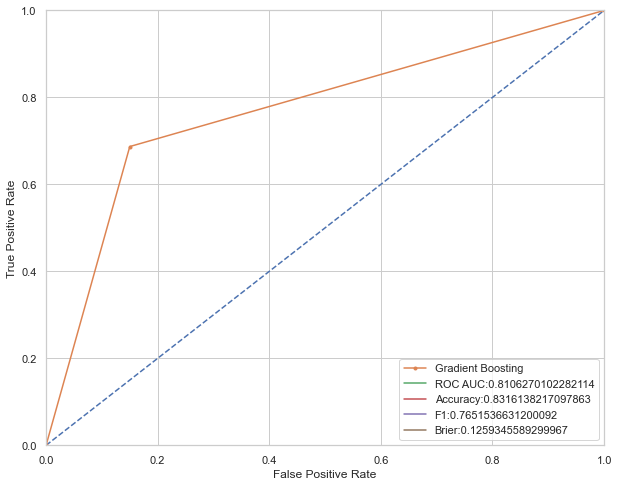

In [1053]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, gbc_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Gradient Boosting')
plt.plot(0, label = 'ROC AUC:'+str(gbc_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(gbc_accuracy))
plt.plot(0, label = 'F1:'+str(gbc_f1))
plt.plot(0, label = 'Brier:'+str(gbc_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1054]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    gbc_thresh_predicts = gbc_class1_probs > threshold
    precision = precision_score(y_test, gbc_thresh_predicts)
    recall = recall_score(y_test, gbc_thresh_predicts)
    f1 = f1_score(y_test, gbc_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.02 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.03 | Accuracy = 0.396, Completeness = 0.983 | F1 = 0.565
Threshold = 0.04 | Accuracy = 0.404, Completeness = 0.974 | F1 = 0.571
Threshold = 0.05 | Accuracy = 0.413, Completeness = 0.948 | F1 = 0.575
Threshold = 0.06 | Accuracy = 0.418, Completeness = 0.948 | F1 = 0.580
Threshold = 0.07 | Accuracy = 0.434, Completeness = 0.948 | F1 = 0.596
Threshold = 0.08 | Accuracy = 0.457, Completeness = 0.922 | F1 = 0.611
Threshold = 0.09 | Accuracy = 0.482, Completeness = 0.913 | F1 = 0.631
Threshold = 0.10 | Accuracy = 0.507, Completeness = 0.904 | F1 = 0.650
Threshold = 0.11 | Accuracy = 0.523, Completeness = 0.887 | F1 = 0.658
Threshold = 0.12 | Accuracy = 0.543, Completeness = 0.878 | F1 = 0.671
Threshold = 0.13 | Accuracy = 0.543, Completeness = 0.870 | F1 = 0.669
Thresh

In [1055]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    gbc_thresh_predicts = gbc_class1_probs > threshold
    f1 = f1_score(y_test, gbc_thresh_predicts)
    if f1_list.max() == f1:
        gbc_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", gbc_best_threshold)

Maximum f1 score is: 0.742 and best threshold is: 0.26


In [1056]:
def custom_predict(X, threshold):
    
    return (gbc_class1_probs > threshold).astype(int)
    
    
gbc_thresh_predicts = custom_predict(X = x_test, threshold = gbc_best_threshold) 

gbc_thresh_cm= confusion_matrix(y_test, gbc_thresh_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_thresh_cm)


Gradient Boosting Confusion Matrix:

[[134  46]
 [ 20  95]]


In [1057]:
print(classification_report(y_test, gbc_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.87      0.74      0.80       180
           1       0.67      0.83      0.74       115

    accuracy                           0.78       295
   macro avg       0.77      0.79      0.77       295
weighted avg       0.79      0.78      0.78       295



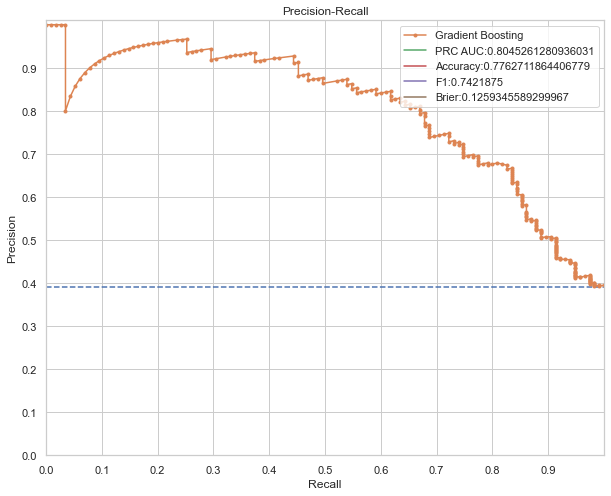

In [1058]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, gbc_class1_probs)
gbc_thresh_f1, gbc_prc_auc = f1_score(y_test, gbc_thresh_predicts), auc(recall, precision)
gbc_thresh_accuracy = accuracy_score(y_test, gbc_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Gradient Boosting')
plt.plot(0,label='PRC AUC:'+str(gbc_prc_auc))
plt.plot(0,label='Accuracy:'+str(gbc_thresh_accuracy))
plt.plot(0,label='F1:'+str(gbc_thresh_f1))
plt.plot(0,label='Brier:'+str(gbc_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [1059]:
gbc_params = {"learning_rate" : [0.001, 0.01, 0.1, 0.05, 1, 2],
             "n_estimators": [100,500,1000],
              "subsample":[0.1, 0.3, 0.5, 0.7, 0.9],
             "max_depth": [2, 3,5,10, 15],
             "min_samples_split": [2,5, 8,10],
             "criterion":['friedman_mse', 'squared_error', 'mse', 'mae'],
             "loss":['deviance', 'exponential'],
             "min_samples_leaf":[1,2,3,4,5,10],
             "min_impurity_decrease":[0,1,2,3],
             "tol":[0.0001, 0.001, 0.01, 0.1]}

gbc_tuned = RandomizedSearchCV(gbc, 
                           gbc_params, 
                           cv = cv,
                           n_iter = 200,    
                           n_jobs = -1, 
                           verbose = 2,
                              scoring='f1') 

gbc_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(gbc_tuned.best_params_))

Fitting 7 folds for each of 200 candidates, totalling 1400 fits


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

En iyi parametreler: {'tol': 0.1, 'subsample': 0.1, 'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 5, 'min_impurity_decrease': 0, 'max_depth': 15, 'loss': 'exponential', 'learning_rate': 0.1, 'criterion': 'mae'}


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_cl

In [1060]:
gbc_tuned= GradientBoostingClassifier(learning_rate=gbc_tuned.best_params_["learning_rate"],
                                max_depth=gbc_tuned.best_params_["max_depth"],
                                min_samples_split=gbc_tuned.best_params_["min_samples_split"],
                                n_estimators=gbc_tuned.best_params_["n_estimators"],
                                subsample=gbc_tuned.best_params_["subsample"],
                                criterion=gbc_tuned.best_params_["criterion"],
                                loss=gbc_tuned.best_params_["loss"],
                                min_samples_leaf=gbc_tuned.best_params_["min_samples_leaf"],
                                min_impurity_decrease=gbc_tuned.best_params_["min_impurity_decrease"],
                                tol=gbc_tuned.best_params_["tol"])
gbc_tuned.fit(x_train, y_train)

gbc_tuned_predicts= gbc_tuned.predict(x_test)

gbc_tuned_class1_probs =gbc_tuned.predict_proba(x_test)[:, 1]

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

In [1061]:
gbc_tuned_cm= confusion_matrix(y_test, gbc_tuned_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_tuned_cm)


Gradient Boosting Confusion Matrix:

[[155  25]
 [ 36  79]]


In [1062]:
print(classification_report(y_test, gbc_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.86      0.84       180
           1       0.76      0.69      0.72       115

    accuracy                           0.79       295
   macro avg       0.79      0.77      0.78       295
weighted avg       0.79      0.79      0.79       295



In [1063]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_f1 = mean(scor)
print("Gradient Boosting doğrulanmış f1 skoru:", gbc_tuned_f1)

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

Gradient Boosting doğrulanmış f1 skoru: 0.7712633494038444


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_cl

In [1064]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_accuracy = mean(scor)
print("Gradient Boosting doğrulanmış accuracy skoru:", gbc_tuned_accuracy)

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

Gradient Boosting doğrulanmış accuracy skoru: 0.8327606510123735


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_cl

In [1065]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_brier = -1*mean(scor)
print("Gradient Boosting doğrulanmış brier skoru:", gbc_tuned_brier)

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

Gradient Boosting doğrulanmış brier skoru: 0.14854430695374932


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


In [1066]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_roc_auc = mean(scor)
print("Gradient Boosting doğrulanmış roc-auc skoru:", gbc_tuned_roc_auc)

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1284: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'squared_error' instead, as trees should use a squared error criterion in Gradient Boosting.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` 

Gradient Boosting doğrulanmış roc-auc skoru: 0.8096128770050237


C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\tree\_cl

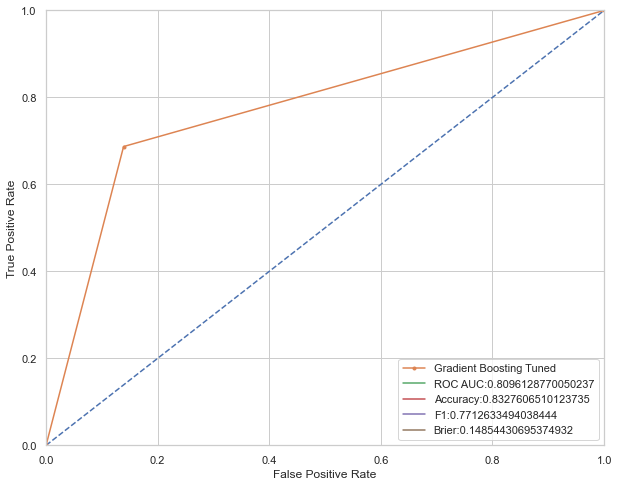

In [1067]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, gbc_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Gradient Boosting Tuned')
plt.plot(0, label = 'ROC AUC:'+str(gbc_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(gbc_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(gbc_tuned_f1))
plt.plot(0, label = 'Brier:'+str(gbc_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1068]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    gbc_tuned_thresh_predicts = gbc_tuned_class1_probs > threshold
    precision = precision_score(y_test, gbc_tuned_thresh_predicts)
    recall = recall_score(y_test, gbc_tuned_thresh_predicts)
    f1 = f1_score(y_test, gbc_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.646, Completeness = 0.809 | F1 = 0.718
Threshold = 0.02 | Accuracy = 0.654, Completeness = 0.774 | F1 = 0.709
Threshold = 0.03 | Accuracy = 0.672, Completeness = 0.765 | F1 = 0.715
Threshold = 0.04 | Accuracy = 0.672, Completeness = 0.765 | F1 = 0.715
Threshold = 0.05 | Accuracy = 0.677, Completeness = 0.748 | F1 = 0.711
Threshold = 0.06 | Accuracy = 0.683, Completeness = 0.748 | F1 = 0.714
Threshold = 0.07 | Accuracy = 0.694, Completeness = 0.748 | F1 = 0.720
Threshold = 0.08 | Accuracy = 0.694, Completeness = 0.748 | F1 = 0.720
Threshold = 0.09 | Accuracy = 0.699, Completeness = 0.748 | F1 = 0.723
Threshold = 0.10 | Accuracy = 0.699, Completeness = 0.748 | F1 = 0.723
Threshold = 0.11 | Accuracy = 0.699, Completeness = 0.748 | F1 = 0.723
Threshold = 0.12 | Accuracy = 0.699, Completeness = 0.748 | F1 = 0.723
Threshold = 0.13 | Accuracy = 0.723, Completeness = 0.748 | F1 = 0.735
Thresh

In [1069]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    gbc_tuned_thresh_predicts = gbc_tuned_class1_probs > threshold
    f1 = f1_score(y_test, gbc_tuned_thresh_predicts)
    if f1_list.max() == f1:
        gbc_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", gbc_best_threshold)

Maximum f1 score is: 0.736 and best threshold is: 0.18


In [1070]:
def custom_predict(X, threshold):
    
    return (gbc_tuned_class1_probs > threshold).astype(int)
    
    
gbc_tuned_thresh_predicts = custom_predict(X = x_test, threshold = gbc_best_threshold) 

In [1071]:
gbc_tuned_thresh_cm= confusion_matrix(y_test, gbc_tuned_thresh_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_tuned_thresh_cm)


Gradient Boosting Confusion Matrix:

[[149  31]
 [ 30  85]]


In [1072]:
print(classification_report(y_test, gbc_tuned_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83       180
           1       0.73      0.74      0.74       115

    accuracy                           0.79       295
   macro avg       0.78      0.78      0.78       295
weighted avg       0.79      0.79      0.79       295



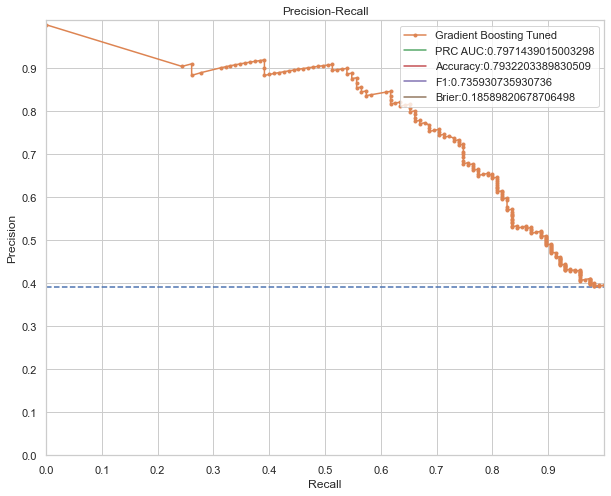

In [1073]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, gbc_tuned_class1_probs)
gbc_tuned_thresh_f1, gbc_tuned_prc_auc = f1_score(y_test, gbc_tuned_thresh_predicts), auc(recall, precision)
gbc_tuned_thresh_accuracy = accuracy_score(y_test, gbc_tuned_thresh_predicts)
gbc_tuned_brier = brier_score_loss(y_test, gbc_tuned_class1_probs)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Gradient Boosting Tuned')
plt.plot(0,label='PRC AUC:'+str(gbc_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(gbc_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(gbc_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(gbc_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Ada Boost

In [1074]:
ada= AdaBoostClassifier()
ada.fit(x_train, y_train)

ada_predicts= ada.predict(x_test)
ada_cm= confusion_matrix(y_test, ada_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_cm)


Ada Boost Confusion Matrix:

[[139  41]
 [ 33  82]]


In [1075]:
print(classification_report(y_test, ada_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.77      0.79       180
           1       0.67      0.71      0.69       115

    accuracy                           0.75       295
   macro avg       0.74      0.74      0.74       295
weighted avg       0.75      0.75      0.75       295



In [1076]:
ada_f1 = cross_val_score(ada, x, y, cv=cv, scoring='f1').mean()
print("Ada Boost doğrulanmış f1 skoru:", ada_f1)

Ada Boost doğrulanmış f1 skoru: 0.7645877517252473


In [1077]:
ada_accuracy = cross_val_score(ada, x, y, cv=cv, scoring='accuracy').mean()
print("Ada Boost doğrulanmış accuracy skoru:", ada_accuracy)

Ada Boost doğrulanmış accuracy skoru: 0.8203388638920135


In [1078]:
ada_brier = -1*cross_val_score(ada, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Ada Boost doğrulanmış brier skoru:", ada_brier)

Ada Boost doğrulanmış brier skoru: 0.23924385643671092


In [1079]:
ada_roc_auc = cross_val_score(ada, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Ada Boost doğrulanmış roc-auc skoru:", ada_roc_auc)

Ada Boost doğrulanmış roc-auc skoru: 0.8096730833103862


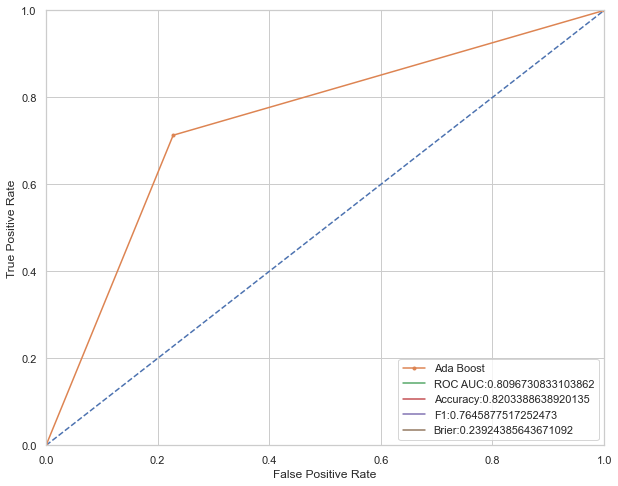

In [1080]:
ada_class1_probs = ada.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, ada_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Ada Boost')
plt.plot(0, label = 'ROC AUC:'+str(ada_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(ada_accuracy))
plt.plot(0, label = 'F1:'+str(ada_f1))
plt.plot(0, label = 'Brier:'+str(ada_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1081]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    ada_thresh_predicts = ada_class1_probs > threshold
    precision = precision_score(y_test, ada_thresh_predicts)
    recall = recall_score(y_test, ada_thresh_predicts)
    f1 = f1_score(y_test, ada_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.02 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.03 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.04 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.05 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.06 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.07 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.08 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.09 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.10 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.11 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.12 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.13 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Thresh

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precis

In [1082]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    ada_thresh_predicts = ada_class1_probs > threshold
    f1 = f1_score(y_test, ada_thresh_predicts)
    if f1_list.max() == f1:
        ada_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", ada_best_threshold)

Maximum f1 score is: 0.689 and best threshold is: 0.5


In [1083]:
def custom_predict(X, threshold):
    
    return (ada_class1_probs > threshold).astype(int)
    
    
ada_thresh_predicts = custom_predict(X = x_test, threshold = ada_best_threshold) 

ada_thresh_cm= confusion_matrix(y_test, ada_thresh_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_thresh_cm)


Ada Boost Confusion Matrix:

[[139  41]
 [ 33  82]]


In [1084]:
print(classification_report(y_test, ada_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.77      0.79       180
           1       0.67      0.71      0.69       115

    accuracy                           0.75       295
   macro avg       0.74      0.74      0.74       295
weighted avg       0.75      0.75      0.75       295



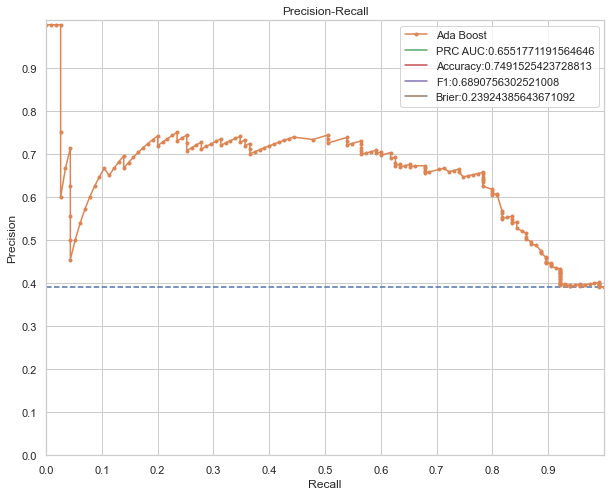

In [1085]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, ada_class1_probs)
ada_thresh_f1, ada_prc_auc = f1_score(y_test, ada_thresh_predicts), auc(recall, precision)
ada_thresh_accuracy = accuracy_score(y_test, ada_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Ada Boost')
plt.plot(0,label='PRC AUC:'+str(ada_prc_auc))
plt.plot(0,label='Accuracy:'+str(ada_thresh_accuracy))
plt.plot(0,label='F1:'+str(ada_thresh_f1))
plt.plot(0,label='Brier:'+str(ada_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [1086]:
ada_params = {"learning_rate" : [0.001, 0.01, 0.1, 0.05],
             "n_estimators": [1, 25, 50,100,250, 500,1000]
             
             }

ada_tuned = GridSearchCV(ada, 
                           ada_params, 
                           cv = cv, 
                           
                               scoring='f1',
                               
                           n_jobs = -1, 
                           verbose = 2) 

ada_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(ada_tuned.best_params_))

ada_tuned= AdaBoostClassifier(learning_rate=ada_tuned.best_params_["learning_rate"],
                                
                                n_estimators=ada_tuned.best_params_["n_estimators"])

ada_tuned.fit(x_train, y_train)

ada_tuned_predicts= ada_tuned.predict(x_test)

ada_tuned_class1_probs =ada_tuned.predict_proba(x_test)[:, 1]

Fitting 7 folds for each of 28 candidates, totalling 196 fits
En iyi parametreler: {'learning_rate': 0.1, 'n_estimators': 100}


In [1087]:
ada_tuned_cm= confusion_matrix(y_test, ada_tuned_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_tuned_cm)

print(classification_report(y_test, ada_tuned_predicts, target_names=target_names))


Ada Boost Confusion Matrix:

[[143  37]
 [ 31  84]]
              precision    recall  f1-score   support

           0       0.82      0.79      0.81       180
           1       0.69      0.73      0.71       115

    accuracy                           0.77       295
   macro avg       0.76      0.76      0.76       295
weighted avg       0.77      0.77      0.77       295



In [1088]:
ada_tuned_f1 = cross_val_score(ada_tuned, x, y, cv=cv, scoring='f1').mean()
print("Ada Boost doğrulanmış f1 skoru:", ada_tuned_f1)

Ada Boost doğrulanmış f1 skoru: 0.7599875762515937


In [1089]:
ada_tuned_accuracy = cross_val_score(ada_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("Ada Boost doğrulanmış accuracy skoru:", ada_tuned_accuracy)

Ada Boost doğrulanmış accuracy skoru: 0.8192491563554556


In [1090]:
ada_tuned_brier = -1*cross_val_score(ada_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Ada Boost doğrulanmış brier skoru:", ada_tuned_brier)

Ada Boost doğrulanmış brier skoru: 0.2214252309370391


In [1091]:
ada_tuned_roc_auc = cross_val_score(ada_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Ada Boost doğrulanmış roc-auc skoru:", ada_tuned_roc_auc)

Ada Boost doğrulanmış roc-auc skoru: 0.8059707208102326


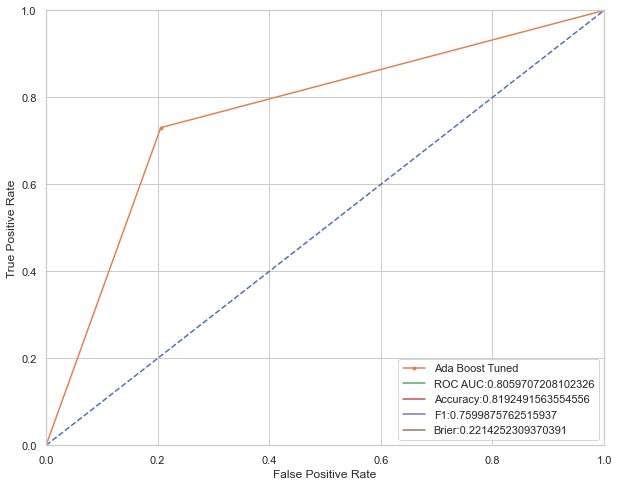

In [1092]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, ada_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Ada Boost Tuned')
plt.plot(0, label = 'ROC AUC:'+str(ada_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(ada_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(ada_tuned_f1))
plt.plot(0, label = 'Brier:'+str(ada_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1093]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    ada_tuned_thresh_predicts = ada_tuned_class1_probs > threshold
    precision = precision_score(y_test, ada_tuned_thresh_predicts)
    recall = recall_score(y_test, ada_tuned_thresh_predicts)
    f1 = f1_score(y_test, ada_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.02 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.03 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.04 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.05 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.06 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.07 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.08 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.09 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.10 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.11 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.12 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.13 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Thresh

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precis

In [1094]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    ada_tuned_thresh_predicts = ada_tuned_class1_probs > threshold
    f1 = f1_score(y_test, ada_tuned_thresh_predicts)
    if f1_list.max() == f1:
        ada_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", ada_best_threshold)

Maximum f1 score is: 0.715 and best threshold is: 0.48


In [1095]:
def custom_predict(X, threshold):
    
    return (ada_tuned_class1_probs > threshold).astype(int)
    
    
ada_tuned_thresh_predicts = custom_predict(X = x_test, threshold = ada_best_threshold) 

ada_tuned_thresh_cm= confusion_matrix(y_test, ada_tuned_thresh_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(ada_tuned_thresh_cm)


Gradient Boosting Confusion Matrix:

[[128  52]
 [ 22  93]]


In [1096]:
print(classification_report(y_test, ada_tuned_thresh_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.85      0.71      0.78       180
           1       0.64      0.81      0.72       115

    accuracy                           0.75       295
   macro avg       0.75      0.76      0.75       295
weighted avg       0.77      0.75      0.75       295



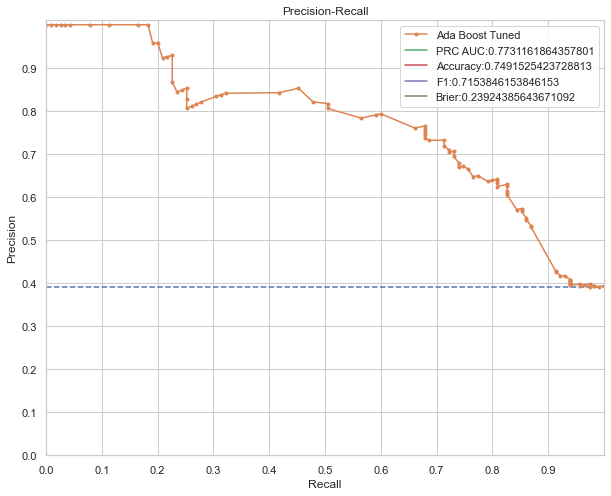

In [1097]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, ada_tuned_class1_probs)
ada_tuned_thresh_f1, ada_tuned_prc_auc = f1_score(y_test, ada_tuned_thresh_predicts), auc(recall, precision)
ada_tuned_thresh_accuracy = accuracy_score(y_test, ada_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Ada Boost Tuned')
plt.plot(0,label='PRC AUC:'+str(ada_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(ada_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(ada_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(ada_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Decision Tree

In [1098]:
dt= DecisionTreeClassifier()
dt.fit(x_train, y_train)

dt_predicts= dt.predict(x_test)
dt_cm= confusion_matrix(y_test, dt_predicts)
print("\nDecision Tree Confusion Matrix:\n")
print(dt_cm)


Decision Tree Confusion Matrix:

[[151  29]
 [ 35  80]]


In [1099]:
print(classification_report(y_test, dt_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.84      0.83       180
           1       0.73      0.70      0.71       115

    accuracy                           0.78       295
   macro avg       0.77      0.77      0.77       295
weighted avg       0.78      0.78      0.78       295



In [1100]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_f1 = mean(scor)
print("Decision Tree doğrulanmış f1 skoru:", dt_f1)

Decision Tree doğrulanmış f1 skoru: 0.7051213387208719


In [1101]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_accuracy = mean(scor)
print("Decision Tree doğrulanmış accuracy skoru:", dt_accuracy)

Decision Tree doğrulanmış accuracy skoru: 0.775679803940523


In [1102]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_roc_auc = mean(scor)
print("Decision Tree doğrulanmış roc-auc skoru:", dt_roc_auc)

Decision Tree doğrulanmış roc-auc skoru: 0.7615674413674567


In [ ]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, dt_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Decision Tree')
plt.plot(0, label = 'ROC AUC:'+str(dt_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(dt_accuracy))
plt.plot(0, label = 'F1:'+str(dt_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

### Hyperparameter Tuning

In [ ]:
dt_params = {"criterion" : ["gini", "entropy"],
             "splitter" : ["best", "random"],
             "min_samples_leaf":[1, 3, 5],
             "min_weight_fraction_leaf" : [0, 0.001,  0.1],
             "max_features" : ["auto", "sqrt", "log2"],
             "min_impurity_decrease":[0, 0.01, 0.1],
             "class_weight":['balanced'],
             "ccp_alpha":[0, 0.001, 0.01],
            "max_depth": [1 ,3, 5],
            "min_samples_split" : [2,3,4 ,5 ] }

dt_tuned = RandomizedSearchCV(dt, 
                           dt_params, 
                           cv = cv,
                           n_iter = 200,
                           n_jobs = -1, 
                           verbose = 2,scoring='f1') 

dt_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(dt_tuned.best_params_))

In [ ]:
dt_tuned= DecisionTreeClassifier(max_depth=dt_tuned.best_params_["max_depth"],
                                
                                min_samples_split=dt_tuned.best_params_["min_samples_split"],
                                 
                                criterion=dt_tuned.best_params_["criterion"],
                                
                                splitter=dt_tuned.best_params_["splitter"],
                                min_samples_leaf=dt_tuned.best_params_["min_samples_leaf"],
                                
                                min_weight_fraction_leaf=dt_tuned.best_params_["min_weight_fraction_leaf"],
                                max_features=dt_tuned.best_params_["max_features"],
                                
                                min_impurity_decrease=dt_tuned.best_params_["min_impurity_decrease"],
                                class_weight=dt_tuned.best_params_["class_weight"],
                                
                                ccp_alpha=dt_tuned.best_params_["ccp_alpha"],
                                )

dt_tuned.fit(x_train, y_train)

dt_tuned_predicts= dt_tuned.predict(x_test)

In [ ]:
dt_tuned_cm= confusion_matrix(y_test, dt_tuned_predicts)
print("\nDecision Tree Confusion Matrix:\n")
print(dt_tuned_cm)

In [ ]:
print(classification_report(y_test, dt_tuned_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_tuned_f1 = mean(scor)
print("Decision Tree doğrulanmış f1 skoru:", dt_tuned_f1)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_tuned_accuracy = mean(scor)
print("Decision Tree doğrulanmış accuracy skoru:", dt_tuned_accuracy)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(dt_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
dt_tuned_roc_auc = mean(scor)
print("Decision Tree doğrulanmış roc-auc skoru:", dt_tuned_roc_auc)

In [ ]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, dt_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Decision Tree Tuned')
plt.plot(0, label = 'ROC AUC:'+str(dt_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(dt_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(dt_tuned_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

## Extra Trees

In [ ]:
et= ExtraTreesClassifier()
et.fit(x_train, y_train)

et_predicts= et.predict(x_test)
et_cm= confusion_matrix(y_test, et_predicts)
print("\nExtra Trees Classifier Confusion Matrix:\n")
print(et_cm)

In [ ]:
print(classification_report(y_test, et_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_f1 = mean(scor)
print("Extra Tree doğrulanmış f1 skoru:", et_f1)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_accuracy = mean(scor)
print("Extra Tree doğrulanmış accuracy skoru:", et_accuracy)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_brier = -1*mean(scor)
print("Extra Tree doğrulanmış brier skoru:", et_brier)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_roc_auc = mean(scor)
print("Extra Tree doğrulanmış roc-auc skoru:", et_roc_auc)

In [ ]:
et_class1_probs = et.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, et_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Extra Trees')
plt.plot(0, label = 'ROC AUC:'+str(et_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(et_accuracy))
plt.plot(0, label = 'F1:'+str(et_f1))
plt.plot(0, label = 'Brier:'+str(et_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    et_thresh_predicts = et_class1_probs > threshold
    precision = precision_score(y_test, et_thresh_predicts)
    recall = recall_score(y_test, et_thresh_predicts)
    f1 = f1_score(y_test, et_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    et_thresh_predicts = et_class1_probs > threshold
    f1 = f1_score(y_test, et_thresh_predicts)
    if f1_list.max() == f1:
        et_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", et_best_threshold)

def custom_predict(X, threshold):
    
    return (et_class1_probs > threshold).astype(int)
    
    
et_thresh_predicts = custom_predict(X = x_test, threshold = et_best_threshold) 

et_thresh_cm= confusion_matrix(y_test, et_thresh_predicts)
print("\nExtra Trees Confusion Matrix:\n")
print(et_thresh_cm)

In [ ]:
print(classification_report(y_test, et_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, et_class1_probs)
et_thresh_f1, et_prc_auc = f1_score(y_test, et_thresh_predicts), auc(recall, precision)
et_thresh_accuracy = accuracy_score(y_test, et_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Extra Trees')
plt.plot(0,label='PRC AUC:'+str(et_prc_auc))
plt.plot(0,label='Accuracy:'+str(et_thresh_accuracy))
plt.plot(0,label='F1:'+str(et_thresh_f1))
plt.plot(0,label='Brier:'+str(et_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [ ]:
et_params = {"criterion":["gini", "entropy"],
             "min_samples_split" : [2, 3, 4, 5, 6, 7 ,8 ,9, 10],
             "max_features": [2, 3,4, 5,6,7,8,9 ,10,"auto"],
             "n_estimators": [10,25,50,100,250,500,100],
             "class_weight":['balanced_subsample', 'balanced'],
    
    
             
             }

et_tuned = RandomizedSearchCV(et, 
                           et_params, 
                           cv = cv,
                            n_iter = 200,
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 

et_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(et_tuned.best_params_))

et_tuned= ExtraTreesClassifier(criterion=et_tuned.best_params_["criterion"],
                                
                                min_samples_split=et_tuned.best_params_["min_samples_split"],
                              max_features=et_tuned.best_params_["max_features"],
                               n_estimators=et_tuned.best_params_["n_estimators"],
            
                              class_weight=et_tuned.best_params_["class_weight"])
                              

et_tuned.fit(x_train, y_train)

et_tuned_predicts= et_tuned.predict(x_test)

et_tuned_class1_probs =et_tuned.predict_proba(x_test)[:, 1]

et_tuned_cm= confusion_matrix(y_test, et_tuned_predicts)
print("\nExtra Trees Confusion Matrix:\n")
print(et_tuned_cm)

print(classification_report(y_test, et_tuned_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_tuned_f1 = mean(scor)
print("ExtraTree doğrulanmış f1 skoru:", et_tuned_f1)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_tuned_accuracy = mean(scor)
print("ExtraTree doğrulanmış accuracy skoru:", et_tuned_accuracy)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_tuned_brier = -1*mean(scor)
print("ExtraTree doğrulanmış brier skoru:", et_tuned_brier)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(et_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
et_tuned_roc_auc = mean(scor)
print("Extra Tree doğrulanmış roc-auc skoru:", et_tuned_roc_auc)

In [ ]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, et_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Extra Trees Tuned')
plt.plot(0, label = 'ROC AUC:'+str(et_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(et_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(et_tuned_f1))
plt.plot(0, label = 'Brier:'+str(et_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    et_tuned_thresh_predicts = et_tuned_class1_probs > threshold
    precision = precision_score(y_test, et_tuned_thresh_predicts)
    recall = recall_score(y_test, et_tuned_thresh_predicts)
    f1 = f1_score(y_test, et_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    et_tuned_thresh_predicts = et_tuned_class1_probs > threshold
    f1 = f1_score(y_test, et_tuned_thresh_predicts)
    if f1_list.max() == f1:
        et_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", et_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (et_tuned_class1_probs > threshold).astype(int)
    
    
et_tuned_thresh_predicts = custom_predict(X = x_test, threshold = et_tuned_best_threshold) 

et_tuned_thresh_cm= confusion_matrix(y_test, et_tuned_thresh_predicts)
print("\nExtra Trees Confusion Matrix:\n")
print(et_tuned_thresh_cm)

print(classification_report(y_test, et_tuned_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, et_tuned_class1_probs)
et_tuned_thresh_f1, et_tuned_prc_auc = f1_score(y_test, et_tuned_thresh_predicts), auc(recall, precision)
et_tuned_thresh_accuracy = accuracy_score(y_test, et_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Extra Trees')
plt.plot(0,label='PRC AUC:'+str(et_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(et_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(et_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(et_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Naive Bayes

In [ ]:
nb= GaussianNB()
nb.fit(x_train, y_train)

nb_predicts= nb.predict(x_test)
nb_cm= confusion_matrix(y_test, nb_predicts)
print("\nNaive Bayes  Confusion Matrix:\n")
print(nb_cm)

print(classification_report(y_test, nb_predicts, target_names=target_names))

In [ ]:
cross_val_score(nb, x, y, cv=cv, scoring='f1').mean()

In [ ]:
nb_f1 = cross_val_score(nb, x, y, cv=cv, scoring='f1').mean()
print("Naive Bayes doğrulanmış f1 skoru:", nb_f1)

In [ ]:
nb_accuracy = cross_val_score(nb, x, y, cv=cv, scoring='accuracy').mean()
print("Naive Bayes doğrulanmış accuracy skoru:", nb_accuracy)

In [ ]:
nb_brier = -1*cross_val_score(nb, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Naive Bayes doğrulanmış brier skoru:", nb_brier)

In [ ]:
nb_roc_auc = cross_val_score(nb, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Naive Bayes doğrulanmış roc-auc skoru:", nb_roc_auc)

In [ ]:
nb_class1_probs = nb.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, nb_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Naive Bayes')
plt.plot(0, label = 'ROC AUC:'+str(nb_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(nb_accuracy))
plt.plot(0, label = 'F1:'+str(nb_f1))
plt.plot(0, label = 'Brier:'+str(nb_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    nb_thresh_predicts = nb_class1_probs > threshold
    precision = precision_score(y_test, nb_thresh_predicts)
    recall = recall_score(y_test, nb_thresh_predicts)
    f1 = f1_score(y_test, nb_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    nb_thresh_predicts = nb_class1_probs > threshold
    f1 = f1_score(y_test, nb_thresh_predicts)
    if f1_list.max() == f1:
        nb_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", nb_best_threshold)

def custom_predict(X, threshold):
    
    return (nb_class1_probs > threshold).astype(int)
    
    
nb_thresh_predicts = custom_predict(X = x_test, threshold = nb_best_threshold) 

nb_thresh_cm= confusion_matrix(y_test, nb_thresh_predicts)
print("\nExtra Trees Confusion Matrix:\n")
print(nb_thresh_cm)

print(classification_report(y_test, nb_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, nb_class1_probs)
nb_thresh_f1, nb_prc_auc = f1_score(y_test, nb_thresh_predicts), auc(recall, precision)
nb_thresh_accuracy = accuracy_score(y_test, nb_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Naive Bayes')
plt.plot(0,label='PRC AUC:'+str(nb_prc_auc))
plt.plot(0,label='Accuracy:'+str(nb_thresh_accuracy))
plt.plot(0,label='F1:'+str(nb_thresh_f1))
plt.plot(0,label='Brier:'+str(nb_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [ ]:
nb_params = {"var_smoothing":[0.0000000001, 0.000000001, 0.00000001, 0.0000001,  0.000001, 0.00001, 0.0001,0.001, 0.01]
    
    
             
             }

nb_tuned = GridSearchCV(nb, 
                           nb_params, 
                           cv = cv,
                            
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 

nb_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(nb_tuned.best_params_))

nb_tuned= GaussianNB(var_smoothing=nb_tuned.best_params_["var_smoothing"])
                              

nb_tuned.fit(x_train, y_train)

nb_tuned_predicts= nb_tuned.predict(x_test)

nb_tuned_class1_probs =nb_tuned.predict_proba(x_test)[:, 1]

nb_tuned_cm= confusion_matrix(y_test, nb_tuned_predicts)
print("\nNaive Bayes Confusion Matrix:\n")
print(nb_tuned_cm)

print(classification_report(y_test, nb_tuned_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(nb_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
nb_tuned_f1 = mean(scor)
print("Naive Bayes doğrulanmış accuracy skoru:", nb_tuned_f1)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(nb_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
nb_tuned_accuracy = mean(scor)
print("Naive Bayes doğrulanmış accuracy skoru:", nb_tuned_accuracy)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(nb_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
nb_tuned_brier = -1*mean(scor)
print("Naive Bayes doğrulanmış brier skoru:", nb_tuned_brier)

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(nb_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
nb_tuned_roc_auc = mean(scor)
print("Naive Bayes doğrulanmış roc-auc skoru:", nb_tuned_roc_auc)

In [ ]:
nb_tuned_class1_probs = nb_tuned.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, nb_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Naive Bayes')
plt.plot(0, label = 'ROC AUC:'+str(nb_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(nb_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(nb_tuned_f1))
plt.plot(0, label = 'Brier:'+str(nb_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    nb_tuned_thresh_predicts = nb_tuned_class1_probs > threshold
    precision = precision_score(y_test, nb_tuned_thresh_predicts)
    recall = recall_score(y_test, nb_tuned_thresh_predicts)
    f1 = f1_score(y_test, nb_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    nb_tuned_thresh_predicts = nb_tuned_class1_probs > threshold
    f1 = f1_score(y_test, nb_tuned_thresh_predicts)
    if f1_list.max() == f1:
        nb_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", nb_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (nb_tuned_class1_probs > threshold).astype(int)
    
    
nb_tuned_thresh_predicts = custom_predict(X = x_test, threshold = nb_tuned_best_threshold) 

nb_tuned_thresh_cm= confusion_matrix(y_test, nb_tuned_thresh_predicts)
print("\nExtra Trees Confusion Matrix:\n")
print(nb_tuned_thresh_cm)

print(classification_report(y_test, nb_tuned_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, nb_tuned_class1_probs)
nb_tuned_thresh_f1, nb_tuned_prc_auc = f1_score(y_test, nb_tuned_thresh_predicts), auc(recall, precision)
nb_tuned_thresh_accuracy = accuracy_score(y_test, nb_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Naive Bayes')
plt.plot(0,label='PRC AUC:'+str(nb_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(nb_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(nb_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(nb_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## KNN

In [ ]:
knn= KNeighborsClassifier()
knn.fit(x_train, y_train)

knn_predicts= knn.predict(x_test)
knn_cm= confusion_matrix(y_test, knn_predicts)
print("\nNaive Bayes  Confusion Matrix:\n")
print(knn_cm)

print(classification_report(y_test, knn_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_f1 = mean(scor)
print("KNN doğrulanmış f1 skoru:", knn_f1)

#---------------------------------

scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_accuracy = mean(scor)
print("\nKNN doğrulanmış accuracy skoru:", knn_accuracy)

#---------------------------------
scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_brier = -1*mean(scor)
print("\nKNN doğrulanmış brier skoru:", knn_brier)

#---------------------------------

scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_roc_auc = mean(scor)
print("\nKNN doğrulanmış roc-auc skoru:", knn_roc_auc)

In [ ]:
knn_class1_probs = knn.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, knn_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='KNN')
plt.plot(0, label = 'ROC AUC:'+str(knn_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(knn_accuracy))
plt.plot(0, label = 'F1:'+str(knn_f1))
plt.plot(0, label = 'Brier:'+str(knn_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    knn_thresh_predicts = knn_class1_probs > threshold
    precision = precision_score(y_test, knn_thresh_predicts)
    recall = recall_score(y_test, knn_thresh_predicts)
    f1 = f1_score(y_test, knn_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    knn_thresh_predicts = knn_class1_probs > threshold
    f1 = f1_score(y_test, knn_thresh_predicts)
    if f1_list.max() == f1:
        knn_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", knn_best_threshold)

def custom_predict(X, threshold):
    
    return (knn_class1_probs > threshold).astype(int)
    
    
knn_thresh_predicts = custom_predict(X = x_test, threshold = knn_best_threshold) 

knn_thresh_cm= confusion_matrix(y_test, knn_thresh_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_thresh_cm)

print(classification_report(y_test, knn_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, knn_class1_probs)
knn_thresh_f1, knn_prc_auc = f1_score(y_test, knn_thresh_predicts), auc(recall, precision)
knn_thresh_accuracy = accuracy_score(y_test, knn_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='KNN')
plt.plot(0,label='PRC AUC:'+str(knn_prc_auc))
plt.plot(0,label='Accuracy:'+str(knn_thresh_accuracy))
plt.plot(0,label='F1:'+str(knn_thresh_f1))
plt.plot(0,label='Brier:'+str(knn_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [ ]:
knn_params = {"n_neighbors": [3, 5, 7,9, 11],
             "weights" : ['uniform', 'distance'],
             "algorithm" : ['auto', 'ball_tree', 'kd_tree', 'brute'],
              "leaf_size":[10, 20,30,40,50],
             "p":[1,2]
    
    
             
             }

knn_tuned = GridSearchCV(knn, 
                           knn_params, 
                           cv = cv,
                            
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 

knn_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(knn_tuned.best_params_))

knn_tuned= KNeighborsClassifier(n_neighbors=knn_tuned.best_params_["n_neighbors"],
                     weights=knn_tuned.best_params_["weights"],
                     algorithm=knn_tuned.best_params_["algorithm"],
                     leaf_size=knn_tuned.best_params_["leaf_size"],
                     p=knn_tuned.best_params_["p"])
                              

knn_tuned.fit(x_train, y_train)

knn_tuned_predicts= knn_tuned.predict(x_test)

knn_tuned_class1_probs =knn_tuned.predict_proba(x_test)[:, 1]

knn_tuned_cm= confusion_matrix(y_test, knn_tuned_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_tuned_cm)

print(classification_report(y_test, knn_tuned_predicts, target_names=target_names))

In [ ]:
scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_f1 = mean(scor)
print("KNN doğrulanmış f1 skoru:", knn_tuned_f1)

#---------------------------------

scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_accuracy = mean(scor)
print("\nKNN doğrulanmış accuracy skoru:", knn_tuned_accuracy)

#---------------------------------
scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_brier = -1*mean(scor)
print("\nKNN doğrulanmış brier skoru:", knn_tuned_brier)

#---------------------------------

scores = []
for i in range(1,33):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_roc_auc = mean(scor)
print("\nKNN doğrulanmış roc-auc skoru:", knn_tuned_roc_auc)

In [ ]:
knn_tuned_class1_probs = knn_tuned.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, knn_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='KNN')
plt.plot(0, label = 'ROC AUC:'+str(knn_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(knn_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(knn_tuned_f1))
plt.plot(0, label = 'Brier:'+str(knn_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    knn_tuned_thresh_predicts = knn_tuned_class1_probs > threshold
    precision = precision_score(y_test, knn_tuned_thresh_predicts)
    recall = recall_score(y_test, knn_tuned_thresh_predicts)
    f1 = f1_score(y_test, knn_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    knn_tuned_thresh_predicts = knn_tuned_class1_probs > threshold
    f1 = f1_score(y_test, knn_tuned_thresh_predicts)
    if f1_list.max() == f1:
        knn_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", knn_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (knn_tuned_class1_probs > threshold).astype(int)
    
    
knn_tuned_thresh_predicts = custom_predict(X = x_test, threshold = knn_tuned_best_threshold) 

knn_tuned_thresh_cm= confusion_matrix(y_test, knn_tuned_thresh_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_tuned_thresh_cm)

print(classification_report(y_test, knn_tuned_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, knn_tuned_class1_probs)
knn_tuned_thresh_f1, knn_tuned_prc_auc = f1_score(y_test, knn_tuned_thresh_predicts), auc(recall, precision)
knn_tuned_thresh_accuracy = accuracy_score(y_test, knn_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='KNN')
plt.plot(0,label='PRC AUC:'+str(knn_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(knn_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(knn_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(knn_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## XG Boost

In [ ]:
xg= XGBClassifier()
xg.fit(x_train, y_train)

xg_predicts= xg.predict(x_test)
xg_cm= confusion_matrix(y_test, xg_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_cm)

print(classification_report(y_test, xg_predicts, target_names=target_names))

In [ ]:
xg_f1 = cross_val_score(xg, x, y, cv=cv, scoring='f1').mean()
print("XG Boost doğrulanmış f1 skoru:", xg_f1)

#---------------------------------

xg_accuracy = cross_val_score(xg, x, y, cv=cv, scoring='accuracy').mean()
print("\nXG Boost doğrulanmış accuracy skoru:", xg_accuracy)

#---------------------------------

xg_brier = -1*cross_val_score(xg, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nXG Boost doğrulanmış brier skoru:", xg_brier)

#---------------------------------



xg_roc_auc = cross_val_score(xg, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nXG Boost doğrulanmış roc-auc skoru:", xg_roc_auc)

In [ ]:
xg_class1_probs = xg.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, xg_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='XG  Boost')
plt.plot(0, label = 'ROC AUC:'+str(xg_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(xg_accuracy))
plt.plot(0, label = 'Brier:'+str(xg_brier))
plt.plot(0, label = 'F1:'+str(xg_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    xg_thresh_predicts = xg_class1_probs > threshold
    precision = precision_score(y_test, xg_thresh_predicts)
    recall = recall_score(y_test, xg_thresh_predicts)
    f1 = f1_score(y_test, xg_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    xg_thresh_predicts = xg_class1_probs > threshold
    f1 = f1_score(y_test, xg_thresh_predicts)
    if f1_list.max() == f1:
        xg_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", xg_best_threshold)

def custom_predict(X, threshold):
    
    return (xg_class1_probs > threshold).astype(int)
    
    
xg_thresh_predicts = custom_predict(X = x_test, threshold = xg_best_threshold) 

xg_thresh_cm= confusion_matrix(y_test, xg_thresh_predicts)
print("\XG Boost Confusion Matrix:\n")
print(xg_thresh_cm)

print(classification_report(y_test, xg_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, xg_class1_probs)
xg_thresh_f1, xg_prc_auc = f1_score(y_test, xg_thresh_predicts), auc(recall, precision)
xg_thresh_accuracy = accuracy_score(y_test, xg_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='XG Boost')
plt.plot(0,label='PRC AUC:'+str(xg_prc_auc))
plt.plot(0,label='Accuracy:'+str(xg_thresh_accuracy))
plt.plot(0,label='F1:'+str(xg_thresh_f1))
plt.plot(0,label='Brier:'+str(xg_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [ ]:


xgboost.set_config(verbosity=0)

xg_params = {
        'n_estimators': [10, 100, 500, 1000, 2000],
        'subsample': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5,6, 10],
        'learning_rate': [0.1,0.01,0.02,0.05],
        "min_samples_split": [2,5,10],
        "max_leaves":[0,1,2,3,5,10]}
    
    
             
            

xg_tuned = RandomizedSearchCV(xg, 
                           xg_params, 
                           cv = cv,
                           n_iter=200,
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 


xg_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(xg_tuned.best_params_))

xg_tuned= XGBClassifier(n_estimators=xg_tuned.best_params_["n_estimators"],
                     subsample=xg_tuned.best_params_["subsample"],
                     
                     max_depth=xg_tuned.best_params_["max_depth"],
               learning_rate=xg_tuned.best_params_["learning_rate"],
               min_samples_split=xg_tuned.best_params_["min_samples_split"],
               max_leaves=xg_tuned.best_params_["max_leaves"],
                        eval_metric='mlogloss'
              
                     )
                              

xg_tuned.fit(x_train, y_train)

xg_tuned_predicts= xg_tuned.predict(x_test)

xg_tuned_class1_probs =xg_tuned.predict_proba(x_test)[:, 1]

xg_tuned_cm= confusion_matrix(y_test, xg_tuned_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_tuned_cm)

print(classification_report(y_test, xg_tuned_predicts, target_names=target_names))

In [ ]:
xg_tuned_f1 = cross_val_score(xg_tuned, x, y, cv=cv, scoring='f1').mean()
print("XG Boost doğrulanmış f1 skoru:", xg_tuned_f1)

#---------------------------------


xg_tuned_accuracy = cross_val_score(xg_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nXG Boost doğrulanmış accuracy skoru:", xg_tuned_accuracy)

#---------------------------------

xg_tuned_brier = -1*cross_val_score(xg_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nXG Boost doğrulanmış brier skoru:", xg_tuned_brier)

#---------------------------------


xg_tuned_roc_auc = cross_val_score(xg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nXG Boost doğrulanmış roc-auc skoru:", xg_tuned_roc_auc)

In [ ]:
xg_tuned_class1_probs = xg_tuned.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, xg_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='XG Boost')
plt.plot(0, label = 'ROC AUC:'+str(xg_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(xg_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(xg_tuned_f1))
plt.plot(0, label = 'Brier:'+str(xg_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [ ]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    xg_tuned_thresh_predicts = xg_tuned_class1_probs > threshold
    precision = precision_score(y_test, xg_tuned_thresh_predicts)
    recall = recall_score(y_test, xg_tuned_thresh_predicts)
    f1 = f1_score(y_test, xg_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

In [ ]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    xg_tuned_thresh_predicts = xg_tuned_class1_probs > threshold
    f1 = f1_score(y_test, xg_tuned_thresh_predicts)
    if f1_list.max() == f1:
        xg_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", xg_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (xg_tuned_class1_probs > threshold).astype(int)
    
    
xg_tuned_thresh_predicts = custom_predict(X = x_test, threshold = xg_tuned_best_threshold) 

xg_tuned_thresh_cm= confusion_matrix(y_test, xg_tuned_thresh_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_tuned_thresh_cm)

print(classification_report(y_test, xg_tuned_thresh_predicts, target_names=target_names))

In [ ]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, xg_tuned_class1_probs)
xg_tuned_thresh_f1, xg_tuned_prc_auc = f1_score(y_test, xg_tuned_thresh_predicts), auc(recall, precision)
xg_tuned_thresh_accuracy = accuracy_score(y_test, xg_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='XG Boost')
plt.plot(0,label='PRC AUC:'+str(xg_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(xg_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(xg_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(xg_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Cat Boost

In [ ]:
cb= CatBoostClassifier(verbose=False)
cb.fit(x_train, y_train)

cb_predicts= cb.predict(x_test)
cb_cm= confusion_matrix(y_test, cb_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(cb_cm)

print(classification_report(y_test, cb_predicts, target_names=target_names))

In [1176]:
cb_f1 = cross_val_score(cb, x, y, cv=cv, scoring='f1').mean()
print("Cat Boost doğrulanmış f1 skoru:", cb_f1)

#---------------------------------


cb_accuracy = cross_val_score(cb, x, y, cv=cv, scoring='accuracy').mean()
print("\nCat Boost doğrulanmış accuracy skoru:", cb_accuracy)

#---------------------------------

cb_brier = -1*cross_val_score(cb, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nCat Boost doğrulanmış brier skoru:", cb_brier)

#---------------------------------



cb_roc_auc = cross_val_score(xg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nCat Boost doğrulanmış roc-auc skoru:", cb_roc_auc)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


Cat Boost doğrulanmış f1 skoru: 0.753510928546578


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış accuracy skoru: 0.8248998172103487


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış brier skoru: 0.1263819751149994

Cat Boost doğrulanmış roc-auc skoru: 0.8060268759054602


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


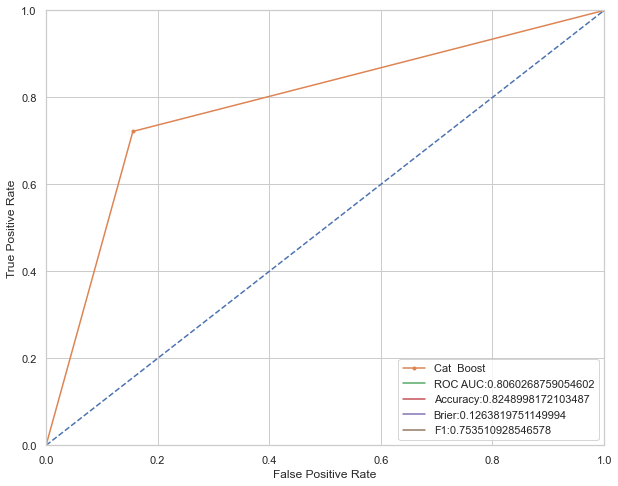

In [1177]:
cb_class1_probs = cb.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Cat  Boost')
plt.plot(0, label = 'ROC AUC:'+str(cb_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(cb_accuracy))
plt.plot(0, label = 'Brier:'+str(cb_brier))
plt.plot(0, label = 'F1:'+str(cb_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1178]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    cb_thresh_predicts = cb_class1_probs > threshold
    precision = precision_score(y_test, cb_thresh_predicts)
    recall = recall_score(y_test, cb_thresh_predicts)
    f1 = f1_score(y_test, cb_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.391, Completeness = 1.000 | F1 = 0.562
Threshold = 0.02 | Accuracy = 0.390, Completeness = 0.983 | F1 = 0.558
Threshold = 0.03 | Accuracy = 0.400, Completeness = 0.974 | F1 = 0.567
Threshold = 0.04 | Accuracy = 0.407, Completeness = 0.965 | F1 = 0.572
Threshold = 0.05 | Accuracy = 0.410, Completeness = 0.965 | F1 = 0.575
Threshold = 0.06 | Accuracy = 0.422, Completeness = 0.948 | F1 = 0.584
Threshold = 0.07 | Accuracy = 0.430, Completeness = 0.930 | F1 = 0.588
Threshold = 0.08 | Accuracy = 0.438, Completeness = 0.922 | F1 = 0.594
Threshold = 0.09 | Accuracy = 0.453, Completeness = 0.913 | F1 = 0.605
Threshold = 0.10 | Accuracy = 0.481, Completeness = 0.896 | F1 = 0.626
Threshold = 0.11 | Accuracy = 0.518, Completeness = 0.887 | F1 = 0.654
Threshold = 0.12 | Accuracy = 0.570, Completeness = 0.887 | F1 = 0.694
Threshold = 0.13 | Accuracy = 0.595, Completeness = 0.870 | F1 = 0.707
Thresh

In [1179]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    cb_thresh_predicts = cb_class1_probs > threshold
    f1 = f1_score(y_test, cb_thresh_predicts)
    if f1_list.max() == f1:
        cb_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", cb_best_threshold)

def custom_predict(X, threshold):
    
    return (cb_class1_probs > threshold).astype(int)
    
    
cb_thresh_predicts = custom_predict(X = x_test, threshold = cb_best_threshold) 

cb_thresh_cm= confusion_matrix(y_test, cb_thresh_predicts)
print("\Cat Boost Confusion Matrix:\n")
print(cb_thresh_cm)

print(classification_report(y_test, cb_thresh_predicts, target_names=target_names))

Maximum f1 score is: 0.745 and best threshold is: 0.41000000000000003
\Cat Boost Confusion Matrix:

[[145  35]
 [ 26  89]]
              precision    recall  f1-score   support

           0       0.85      0.81      0.83       180
           1       0.72      0.77      0.74       115

    accuracy                           0.79       295
   macro avg       0.78      0.79      0.79       295
weighted avg       0.80      0.79      0.79       295



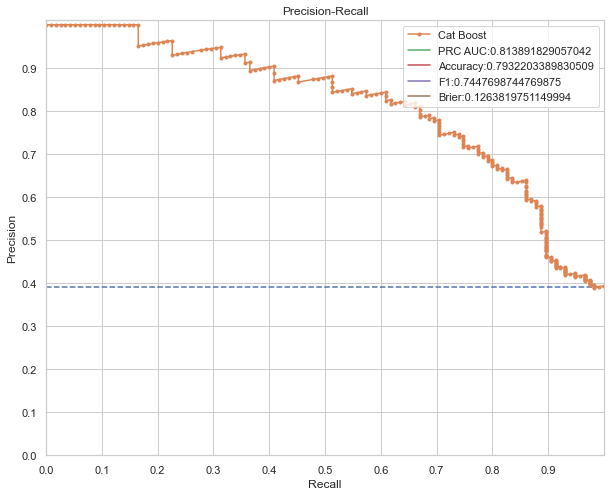

In [1180]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, cb_class1_probs)
cb_thresh_f1, cb_prc_auc = f1_score(y_test, cb_thresh_predicts), auc(recall, precision)
cb_thresh_accuracy = accuracy_score(y_test, cb_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Cat Boost')
plt.plot(0,label='PRC AUC:'+str(cb_prc_auc))
plt.plot(0,label='Accuracy:'+str(cb_thresh_accuracy))
plt.plot(0,label='F1:'+str(cb_thresh_f1))
plt.plot(0,label='Brier:'+str(cb_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [1181]:
cb_params = {
    
    'learning_rate': [0.01,0.05, 0.1],
    
"max_ctr_complexity":[1,2,3,4,5],
'n_estimators': [10, 100, 500, 1000, 2000],
"score_function" : ["L2", "Cosine"],
'subsample': [0.6, 0.8, 1.0],
'max_depth': [3, 4, 5,6, 10],
"min_child_samples":[2,3,4,5,10]}

    
    
             
            

cb_tuned = RandomizedSearchCV(cb, 
                           cb_params, 
                           cv = cv,
                           n_iter=200,
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 


cb_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(cb_tuned.best_params_))

cb_tuned= CatBoostClassifier(
                     learning_rate=cb_tuned.best_params_["learning_rate"],
                     
                     max_depth=cb_tuned.best_params_["max_depth"],
               max_ctr_complexity=cb_tuned.best_params_["max_ctr_complexity"],
               score_function=cb_tuned.best_params_["score_function"],
               
                             subsample=cb_tuned.best_params_["subsample"],
                             min_child_samples=cb_tuned.best_params_["min_child_samples"],
    n_estimators=cb_tuned.best_params_["n_estimators"],
                             verbose=False
                        
              
                     )
                              

cb_tuned.fit(x_train, y_train)

cb_tuned_predicts= cb_tuned.predict(x_test)

cb_tuned_class1_probs =cb_tuned.predict_proba(x_test)[:, 1]

cb_tuned_cm= confusion_matrix(y_test, cb_tuned_predicts)
print("\nCat Boost Confusion Matrix:\n")
print(cb_tuned_cm)

print(classification_report(y_test, cb_tuned_predicts, target_names=target_names))

Fitting 7 folds for each of 200 candidates, totalling 1400 fits


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


En iyi parametreler: {'subsample': 0.8, 'score_function': 'Cosine', 'n_estimators': 500, 'min_child_samples': 10, 'max_depth': 4, 'max_ctr_complexity': 4, 'learning_rate': 0.05}

Cat Boost Confusion Matrix:

[[159  21]
 [ 32  83]]
              precision    recall  f1-score   support

           0       0.83      0.88      0.86       180
           1       0.80      0.72      0.76       115

    accuracy                           0.82       295
   macro avg       0.82      0.80      0.81       295
weighted avg       0.82      0.82      0.82       295



In [1182]:
cb_tuned_f1 = cross_val_score(cb_tuned, x, y, cv=cv, scoring='f1').mean()
print("Cat Boost doğrulanmış f1 skoru:", cb_tuned_f1)

#---------------------------------


cb_tuned_accuracy = cross_val_score(cb_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nCat Boost doğrulanmış accuracy skoru:", cb_tuned_accuracy)

#---------------------------------

cb_tuned_brier = -1*cross_val_score(cb_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nCat Boost doğrulanmış brier skoru:", cb_tuned_brier)

#---------------------------------


cb_tuned_roc_auc = cross_val_score(cb_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nCat Boost doğrulanmış roc-auc skoru:", cb_tuned_roc_auc)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v

Cat Boost doğrulanmış f1 skoru: 0.7617596919069707


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış accuracy skoru: 0.8282831833520811


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış brier skoru: 0.12287368133804298


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış roc-auc skoru: 0.8078841635416164


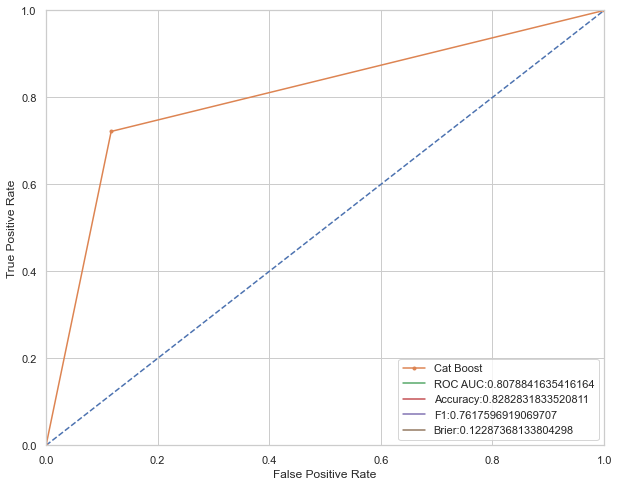

In [1183]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Cat Boost')
plt.plot(0, label = 'ROC AUC:'+str(cb_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(cb_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(cb_tuned_f1))
plt.plot(0, label = 'Brier:'+str(cb_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1184]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    cb_tuned_thresh_predicts = cb_tuned_class1_probs > threshold
    precision = precision_score(y_test, cb_tuned_thresh_predicts)
    recall = recall_score(y_test, cb_tuned_thresh_predicts)
    f1 = f1_score(y_test, cb_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.396, Completeness = 0.991 | F1 = 0.566
Threshold = 0.02 | Accuracy = 0.405, Completeness = 0.983 | F1 = 0.574
Threshold = 0.03 | Accuracy = 0.415, Completeness = 0.974 | F1 = 0.582
Threshold = 0.04 | Accuracy = 0.422, Completeness = 0.948 | F1 = 0.584
Threshold = 0.05 | Accuracy = 0.429, Completeness = 0.939 | F1 = 0.589
Threshold = 0.06 | Accuracy = 0.444, Completeness = 0.930 | F1 = 0.601
Threshold = 0.07 | Accuracy = 0.466, Completeness = 0.904 | F1 = 0.615
Threshold = 0.08 | Accuracy = 0.484, Completeness = 0.904 | F1 = 0.630
Threshold = 0.09 | Accuracy = 0.515, Completeness = 0.887 | F1 = 0.652
Threshold = 0.10 | Accuracy = 0.537, Completeness = 0.887 | F1 = 0.669
Threshold = 0.11 | Accuracy = 0.545, Completeness = 0.887 | F1 = 0.675
Threshold = 0.12 | Accuracy = 0.551, Completeness = 0.887 | F1 = 0.680
Threshold = 0.13 | Accuracy = 0.564, Completeness = 0.878 | F1 = 0.687
Thresh

In [1185]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    cb_tuned_thresh_predicts = cb_tuned_class1_probs > threshold
    f1 = f1_score(y_test, cb_tuned_thresh_predicts)
    if f1_list.max() == f1:
        cb_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", cb_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (cb_tuned_class1_probs > threshold).astype(int)
    
    
cb_tuned_thresh_predicts = custom_predict(X = x_test, threshold = cb_tuned_best_threshold) 

cb_tuned_thresh_cm= confusion_matrix(y_test, cb_tuned_thresh_predicts)
print("\nCat Boost Confusion Matrix:\n")
print(cb_tuned_thresh_cm)

print(classification_report(y_test, cb_tuned_thresh_predicts, target_names=target_names))

Maximum f1 score is: 0.759 and best threshold is: 0.5700000000000001

Cat Boost Confusion Matrix:

[[161  19]
 [ 33  82]]
              precision    recall  f1-score   support

           0       0.83      0.89      0.86       180
           1       0.81      0.71      0.76       115

    accuracy                           0.82       295
   macro avg       0.82      0.80      0.81       295
weighted avg       0.82      0.82      0.82       295



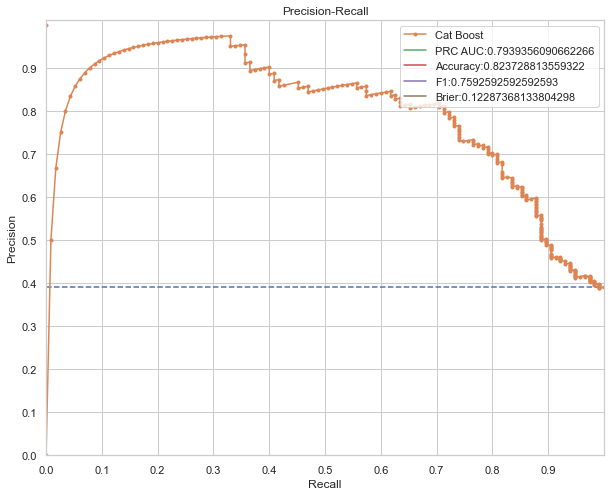

In [1186]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, cb_tuned_class1_probs)
cb_tuned_thresh_f1, cb_tuned_prc_auc = f1_score(y_test, cb_tuned_thresh_predicts), auc(recall, precision)
cb_tuned_thresh_accuracy = accuracy_score(y_test, cb_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Cat Boost')
plt.plot(0,label='PRC AUC:'+str(cb_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(cb_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(cb_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(cb_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

## Light GBM

In [1187]:
lg= LGBMClassifier()
lg.fit(x_train, y_train)

lg_predicts= lg.predict(x_test)
lg_cm= confusion_matrix(y_test, lg_predicts)
print("\nLight GBM Confusion Matrix:\n")
print(lg_cm)

print(classification_report(y_test, lg_predicts, target_names=target_names))


Light GBM Confusion Matrix:

[[155  25]
 [ 32  83]]
              precision    recall  f1-score   support

           0       0.83      0.86      0.84       180
           1       0.77      0.72      0.74       115

    accuracy                           0.81       295
   macro avg       0.80      0.79      0.79       295
weighted avg       0.81      0.81      0.81       295



In [1188]:
lg_f1 = cross_val_score(lg, x, y, cv=cv, scoring='f1').mean()
print("Light GBM doğrulanmış f1 skoru:", lg_f1)

#---------------------------------


lg_accuracy = cross_val_score(lg, x, y, cv=cv, scoring='accuracy').mean()
print("\nLight GBM doğrulanmış accuracy skoru:", lg_accuracy)

#---------------------------------

lg_brier = -1*cross_val_score(lg, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nLight GBM doğrulanmış brier skoru:", lg_brier)

#---------------------------------



lg_roc_auc = cross_val_score(lg, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nLight GBM doğrulanmış roc-auc skoru:", lg_roc_auc)

Light GBM doğrulanmış f1 skoru: 0.7426500600636692

Light GBM doğrulanmış accuracy skoru: 0.8114190804274466

Light GBM doğrulanmış brier skoru: 0.13656604401948488

Light GBM doğrulanmış roc-auc skoru: 0.7925611561219286


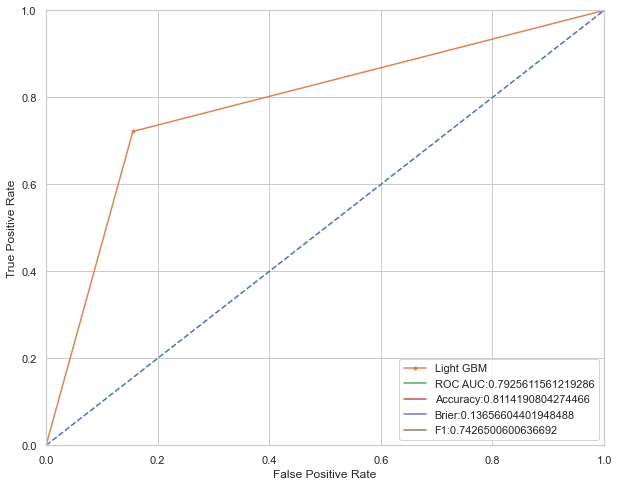

In [1189]:
lg_class1_probs = lg.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Light GBM')
plt.plot(0, label = 'ROC AUC:'+str(lg_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(lg_accuracy))
plt.plot(0, label = 'Brier:'+str(lg_brier))
plt.plot(0, label = 'F1:'+str(lg_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1190]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    lg_thresh_predicts = lg_class1_probs > threshold
    precision = precision_score(y_test, lg_thresh_predicts)
    recall = recall_score(y_test, lg_thresh_predicts)
    f1 = f1_score(y_test, lg_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.424, Completeness = 0.965 | F1 = 0.589
Threshold = 0.02 | Accuracy = 0.437, Completeness = 0.957 | F1 = 0.599
Threshold = 0.03 | Accuracy = 0.470, Completeness = 0.948 | F1 = 0.628
Threshold = 0.04 | Accuracy = 0.486, Completeness = 0.922 | F1 = 0.637
Threshold = 0.05 | Accuracy = 0.500, Completeness = 0.904 | F1 = 0.644
Threshold = 0.06 | Accuracy = 0.507, Completeness = 0.904 | F1 = 0.650
Threshold = 0.07 | Accuracy = 0.515, Completeness = 0.896 | F1 = 0.654
Threshold = 0.08 | Accuracy = 0.526, Completeness = 0.896 | F1 = 0.662
Threshold = 0.09 | Accuracy = 0.537, Completeness = 0.878 | F1 = 0.667
Threshold = 0.10 | Accuracy = 0.533, Completeness = 0.852 | F1 = 0.656
Threshold = 0.11 | Accuracy = 0.539, Completeness = 0.835 | F1 = 0.655
Threshold = 0.12 | Accuracy = 0.542, Completeness = 0.835 | F1 = 0.658
Threshold = 0.13 | Accuracy = 0.549, Completeness = 0.826 | F1 = 0.660
Thresh

In [1191]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    lg_thresh_predicts = lg_class1_probs > threshold
    f1 = f1_score(y_test, lg_thresh_predicts)
    if f1_list.max() == f1:
        lg_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", lg_best_threshold)

def custom_predict(X, threshold):
    
    return (lg_class1_probs > threshold).astype(int)
    
    
lg_thresh_predicts = custom_predict(X = x_test, threshold = lg_best_threshold) 

lg_thresh_cm= confusion_matrix(y_test, lg_thresh_predicts)
print("\Cat Boost Confusion Matrix:\n")
print(lg_thresh_cm)

print(classification_report(y_test, lg_thresh_predicts, target_names=target_names))

Maximum f1 score is: 0.749 and best threshold is: 0.42
\Cat Boost Confusion Matrix:

[[153  27]
 [ 30  85]]
              precision    recall  f1-score   support

           0       0.84      0.85      0.84       180
           1       0.76      0.74      0.75       115

    accuracy                           0.81       295
   macro avg       0.80      0.79      0.80       295
weighted avg       0.81      0.81      0.81       295



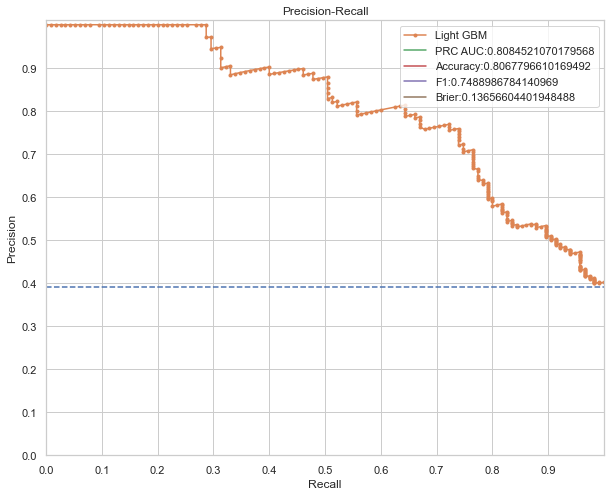

In [1192]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, lg_class1_probs)
lg_thresh_f1, lg_prc_auc = f1_score(y_test, lg_thresh_predicts), auc(recall, precision)
lg_thresh_accuracy = accuracy_score(y_test, lg_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Light GBM')
plt.plot(0,label='PRC AUC:'+str(lg_prc_auc))
plt.plot(0,label='Accuracy:'+str(lg_thresh_accuracy))
plt.plot(0,label='F1:'+str(lg_thresh_f1))
plt.plot(0,label='Brier:'+str(lg_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

### Hyperparameter Tuning

In [1193]:
lg_params = {
        'n_estimators': [100, 500, 1000, 2000],
        'subsample': [0.4,0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5,6],
        'learning_rate': [0.1,0.01,0.02,0.05],
        "min_child_samples": [5,10,20]
              
              }



    
    
             
            

lg_tuned = RandomizedSearchCV(lg, 
                           lg_params, 
                           cv = cv,
                           n_iter=200,
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 


lg_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(lg_tuned.best_params_))

lg_tuned= LGBMClassifier(
                     
                     
                     n_estimators=lg_tuned.best_params_["n_estimators"],
               subsample=lg_tuned.best_params_["subsample"],
               max_depth=lg_tuned.best_params_["max_depth"],
               
                             learning_rate=lg_tuned.best_params_["learning_rate"],
                             min_child_samples=lg_tuned.best_params_["min_child_samples"]
    
    
                        
              
                     )
                              

lg_tuned.fit(x_train, y_train)

lg_tuned_predicts= lg_tuned.predict(x_test)

lg_tuned_class1_probs =lg_tuned.predict_proba(x_test)[:, 1]

lg_tuned_cm= confusion_matrix(y_test, lg_tuned_predicts)
print("\nlight GBM Confusion Matrix:\n")
print(lg_tuned_cm)

print(classification_report(y_test, lg_tuned_predicts, target_names=target_names))

Fitting 7 folds for each of 200 candidates, totalling 1400 fits
En iyi parametreler: {'subsample': 0.4, 'n_estimators': 1000, 'min_child_samples': 5, 'max_depth': 5, 'learning_rate': 0.01}

light GBM Confusion Matrix:

[[155  25]
 [ 36  79]]
              precision    recall  f1-score   support

           0       0.81      0.86      0.84       180
           1       0.76      0.69      0.72       115

    accuracy                           0.79       295
   macro avg       0.79      0.77      0.78       295
weighted avg       0.79      0.79      0.79       295



In [1194]:
lg_tuned_f1 = cross_val_score(lg_tuned, x, y, cv=cv, scoring='f1').mean()
print("Light GBM doğrulanmış f1 skoru:", lg_tuned_f1)

#---------------------------------


lg_tuned_accuracy = cross_val_score(lg_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nLight GBM doğrulanmış accuracy skoru:", lg_tuned_accuracy)

#---------------------------------

lg_tuned_brier = -1*cross_val_score(lg_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nLight GBM doğrulanmış brier skoru:", lg_tuned_brier)

#---------------------------------


lg_tuned_roc_auc = cross_val_score(lg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nLight GBM doğrulanmış roc-auc skoru:", lg_tuned_roc_auc)

Light GBM doğrulanmış f1 skoru: 0.758383657452972

Light GBM doğrulanmış accuracy skoru: 0.8237749578177728

Light GBM doğrulanmış brier skoru: 0.131037288969678

Light GBM doğrulanmış roc-auc skoru: 0.8048166877684445


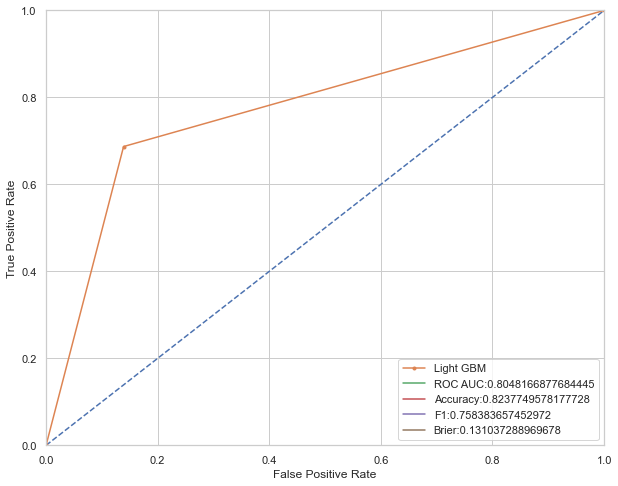

In [1195]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, lg_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Light GBM')
plt.plot(0, label = 'ROC AUC:'+str(lg_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(lg_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(lg_tuned_f1))
plt.plot(0, label = 'Brier:'+str(lg_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

In [1196]:
f1_list = []

for threshold in np.arange(0, 0.95, 0.01):
    lg_tuned_thresh_predicts = lg_tuned_class1_probs > threshold
    precision = precision_score(y_test,lg_tuned_thresh_predicts)
    recall = recall_score(y_test, lg_tuned_thresh_predicts)
    f1 = f1_score(y_test, lg_tuned_thresh_predicts)
    f1_list.append(f1)

    print("Threshold = {:.2f} | Accuracy = {:.3f}, Completeness = {:.3f} | F1 = {:.3f}".format(
        threshold, precision, recall, f1))

Threshold = 0.00 | Accuracy = 0.390, Completeness = 1.000 | F1 = 0.561
Threshold = 0.01 | Accuracy = 0.403, Completeness = 0.974 | F1 = 0.570
Threshold = 0.02 | Accuracy = 0.413, Completeness = 0.948 | F1 = 0.575
Threshold = 0.03 | Accuracy = 0.429, Completeness = 0.939 | F1 = 0.589
Threshold = 0.04 | Accuracy = 0.448, Completeness = 0.930 | F1 = 0.605
Threshold = 0.05 | Accuracy = 0.463, Completeness = 0.922 | F1 = 0.616
Threshold = 0.06 | Accuracy = 0.472, Completeness = 0.896 | F1 = 0.619
Threshold = 0.07 | Accuracy = 0.483, Completeness = 0.878 | F1 = 0.623
Threshold = 0.08 | Accuracy = 0.493, Completeness = 0.870 | F1 = 0.629
Threshold = 0.09 | Accuracy = 0.515, Completeness = 0.870 | F1 = 0.647
Threshold = 0.10 | Accuracy = 0.535, Completeness = 0.870 | F1 = 0.662
Threshold = 0.11 | Accuracy = 0.538, Completeness = 0.870 | F1 = 0.664
Threshold = 0.12 | Accuracy = 0.559, Completeness = 0.870 | F1 = 0.680
Threshold = 0.13 | Accuracy = 0.566, Completeness = 0.861 | F1 = 0.683
Thresh

In [1197]:
f1_list = np.asarray(f1_list)

for threshold in np.arange(0, 0.95, 0.01):
    lg_tuned_thresh_predicts = lg_tuned_class1_probs > threshold
    f1 = f1_score(y_test, lg_tuned_thresh_predicts)
    if f1_list.max() == f1:
        lg_tuned_best_threshold = threshold

print("Maximum f1 score is: %.3f" % f1_list.max(),"and best threshold is:", lg_tuned_best_threshold)

def custom_predict(X, threshold):
    
    return (lg_tuned_class1_probs > threshold).astype(int)
    
    
lg_tuned_thresh_predicts = custom_predict(X = x_test, threshold = lg_tuned_best_threshold) 

lg_tuned_thresh_cm= confusion_matrix(y_test, lg_tuned_thresh_predicts)
print("\nLight GBM Confusion Matrix:\n")
print(lg_tuned_thresh_cm)

print(classification_report(y_test, lg_tuned_thresh_predicts, target_names=target_names))

Maximum f1 score is: 0.725 and best threshold is: 0.56

Light GBM Confusion Matrix:

[[156  24]
 [ 36  79]]
              precision    recall  f1-score   support

           0       0.81      0.87      0.84       180
           1       0.77      0.69      0.72       115

    accuracy                           0.80       295
   macro avg       0.79      0.78      0.78       295
weighted avg       0.79      0.80      0.79       295



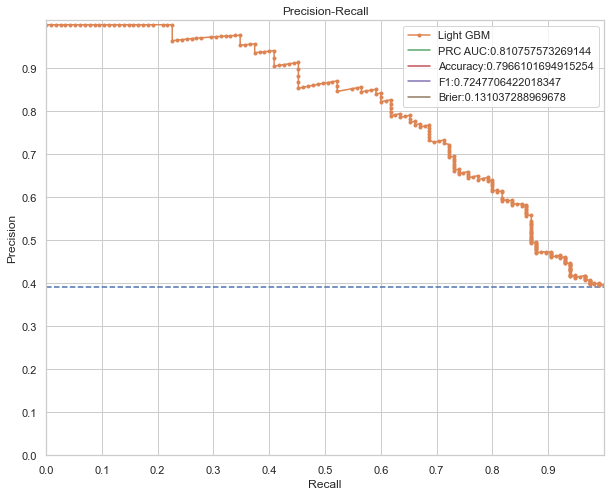

In [1198]:
plt.figure(figsize=(10,8))
nor = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [nor, nor], linestyle='--')
precision, recall, threshold = precision_recall_curve(y_test, lg_tuned_class1_probs)
lg_tuned_thresh_f1, lg_tuned_prc_auc = f1_score(y_test, lg_tuned_thresh_predicts), auc(recall, precision)
lg_tuned_thresh_accuracy = accuracy_score(y_test, lg_tuned_thresh_predicts)
sns.set_theme(style= "whitegrid")

plt.plot(recall, precision, marker='.', label='Light GBM')
plt.plot(0,label='PRC AUC:'+str(lg_tuned_prc_auc))
plt.plot(0,label='Accuracy:'+str(lg_tuned_thresh_accuracy))
plt.plot(0,label='F1:'+str(lg_tuned_thresh_f1))
plt.plot(0,label='Brier:'+str(lg_tuned_brier))
plt.legend(loc=1)


plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.01])
plt.xlim([0.0, 1.0])
plt.xticks(np.arange(0, 1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))
plt.title('Precision-Recall')
plt.legend(loc=1)
plt.show()

# Results

In [1199]:
dt_thresh_accuracy = None
dt_tuned_thresh_accuracy = None
dt_brier=None
dt_tuned_brier=None
dt_thresh_f1 = None
dt_tuned_thresh_f1 = None
dt_prc_auc = None
dt_tuned_prc_auc = None

In [1200]:
model_names = ['Light GBM', 'Random Forest', 'Bagging', 'GBM', 'Ada Boost', 'Decision Tree', 'Extra Trees', 'Naive Bayes', 'KNN', 'XG Boost', 
               'Cat Boost']

accuracy = [lg_accuracy, rf_accuracy, bag_accuracy, gbc_accuracy, ada_accuracy, dt_accuracy, et_accuracy, nb_accuracy, knn_accuracy, xg_accuracy, 
            cb_accuracy]

thresh_accuracy = [lg_thresh_accuracy, rf_thresh_accuracy, bag_thresh_accuracy, gbc_thresh_accuracy, ada_thresh_accuracy, dt_thresh_accuracy,
                  et_thresh_accuracy, nb_thresh_accuracy, knn_thresh_accuracy, xg_thresh_accuracy,cb_thresh_accuracy]

tuned_accuracy = [lg_tuned_accuracy, rf_tuned_accuracy, bag_tuned_accuracy, gbc_tuned_accuracy, ada_tuned_accuracy, dt_tuned_accuracy,
                 et_tuned_accuracy, nb_tuned_accuracy, knn_tuned_accuracy, xg_tuned_accuracy, cb_tuned_accuracy]

tuned_thresh_accuracy=[lg_tuned_thresh_accuracy, rf_tuned_thresh_accuracy, bag_tuned_thresh_accuracy, gbc_tuned_thresh_accuracy, 
                       ada_tuned_thresh_accuracy, dt_tuned_thresh_accuracy, et_tuned_thresh_accuracy, nb_tuned_thresh_accuracy, 
                       knn_tuned_thresh_accuracy, xg_tuned_thresh_accuracy, cb_tuned_thresh_accuracy]

brier = [lg_brier, rf_brier, bag_brier, gbc_brier, ada_brier, dt_brier, et_brier, nb_brier, knn_brier, xg_brier, cb_brier]

tuned_brier =[lg_tuned_brier, rf_tuned_brier, bag_tuned_brier, gbc_tuned_brier, ada_tuned_brier, dt_tuned_brier, et_tuned_brier, nb_tuned_brier, 
              knn_tuned_brier, xg_tuned_brier, cb_tuned_brier]

f1 = [lg_f1, rf_f1, bag_f1, gbc_f1, ada_f1, dt_f1, et_f1, nb_f1, knn_f1, xg_f1, cb_f1]

thresh_f1=[lg_thresh_f1, rf_thresh_f1, bag_thresh_f1, gbc_thresh_f1, ada_thresh_f1, dt_thresh_f1, et_thresh_f1, nb_thresh_f1, knn_thresh_f1, 
           xg_thresh_f1, cb_thresh_f1]

tuned_f1 = [lg_tuned_f1, rf_tuned_f1, bag_tuned_f1, gbc_tuned_f1, ada_tuned_f1, dt_tuned_f1, et_tuned_f1, nb_tuned_f1, knn_tuned_f1, xg_tuned_f1, 
            cb_tuned_f1]

tuned_thresh_f1=[lg_tuned_thresh_f1, rf_tuned_thresh_f1, bag_tuned_thresh_f1, gbc_tuned_thresh_f1, ada_tuned_thresh_f1, dt_tuned_thresh_f1,
                et_tuned_thresh_f1, nb_tuned_thresh_f1, knn_tuned_thresh_f1, xg_tuned_thresh_f1, cb_tuned_thresh_f1]

roc_auc = [lg_roc_auc, rf_roc_auc, bag_roc_auc, gbc_roc_auc, ada_roc_auc, dt_roc_auc, et_roc_auc, nb_roc_auc, knn_roc_auc, xg_roc_auc, cb_roc_auc]

prc_auc =[lg_prc_auc, rf_prc_auc, bag_prc_auc, gbc_prc_auc, ada_prc_auc, dt_prc_auc, et_prc_auc, nb_prc_auc, knn_prc_auc, xg_prc_auc, cb_prc_auc]

tuned_roc_auc = [lg_tuned_roc_auc, rf_tuned_roc_auc, bag_tuned_roc_auc, gbc_tuned_roc_auc, ada_tuned_roc_auc, dt_tuned_roc_auc, et_tuned_roc_auc,
                nb_tuned_roc_auc, knn_tuned_roc_auc, xg_tuned_roc_auc, cb_tuned_roc_auc]

tuned_prc_auc =[lg_tuned_prc_auc, rf_tuned_prc_auc, bag_tuned_prc_auc, gbc_tuned_prc_auc, ada_tuned_prc_auc, dt_tuned_prc_auc, et_tuned_prc_auc,
               nb_tuned_prc_auc, knn_tuned_prc_auc, xg_tuned_prc_auc, cb_tuned_prc_auc]

In [1201]:
model_compare = pd.DataFrame({'Model': model_names, 'Accuracy': accuracy, 'Thresh Accuracy': thresh_accuracy, 'Tuned Accuracy': tuned_accuracy,
             'Tuned Thresh Accuracy': tuned_thresh_accuracy, 'Brier': brier,'Tuned Brier': tuned_brier, 'F1': f1,'Thresh F1': thresh_f1,
             'Tuned F1': tuned_f1, 'Tuned Thresh F1': tuned_thresh_f1, 'Roc Auc': roc_auc, 'Prc Auc': prc_auc, 'Tuned Roc Auc': tuned_roc_auc,
             'Tuned Prc Auc': tuned_prc_auc})

In [1202]:
model_compare.sort_values(by='Tuned Thresh F1', ascending=False)

,Model,Accuracy,Thresh Accuracy,Tuned Accuracy,Tuned Thresh Accuracy,Brier,Tuned Brier,F1,Thresh F1,Tuned F1,Tuned Thresh F1,Roc Auc,Prc Auc,Tuned Roc Auc,Tuned Prc Auc
10,Cat Boost,0.824900,0.793220,0.828283,0.823729,0.126382,0.122874,0.753511,0.744770,0.761760,0.759259,0.806027,0.813892,0.807884,0.793936
7,Naive Bayes,0.814759,0.796610,0.814759,0.796610,0.176600,0.176600,0.762776,0.754098,0.762776,0.754098,0.807862,0.658111,0.807862,0.658111
1,Random Forest,0.801313,0.800000,0.831609,0.783051,0.141958,0.125656,0.732412,0.751055,0.763826,0.751938,0.787938,0.785176,0.807715,0.809174
6,Extra Trees,0.792945,0.776271,0.812863,0.803390,0.163622,0.139251,0.723779,0.713043,0.758006,0.743363,0.778560,0.762689,0.801815,0.800235
2,Bagging,0.810879,0.755932,0.790666,0.789831,0.149579,0.149915,0.726090,0.712000,0.720256,0.741667,0.787154,0.779561,0.769799,0.791743
9,XG Boost,0.811366,0.810169,0.822659,0.793220,0.142986,0.132476,0.747623,0.747748,0.759676,0.740426,0.796355,0.799502,0.806027,0.809171
3,GBM,0.831614,0.776271,0.832761,0.793220,0.125935,0.185898,0.765154,0.742188,0.771263,0.735931,0.810627,0.804526,0.809613,0.797144
8,KNN,0.801304,0.759322,0.809169,0.759322,0.147471,0.144771,0.730203,0.730038,0.741819,0.727969,0.782018,0.788672,0.791188,0.793166
0,Light GBM,0.811419,0.806780,0.823775,0.796610,0.136566,0.131037,0.742650,0.748899,0.758384,0.724771,0.792561,0.808452,0.804817,0.810758
4,Ada Boost,0.820339,0.749153,0.819249,0.749153,0.239244,0.221425,0.764588,0.689076,0.759988,0.715385,0.809673,0.655177,0.805971,0.773116


In [958]:
x_test["class1_probs"]=cb_tuned.predict_proba(x_test)[:,1]

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [959]:
x_test["class1_probs"]=x_test.class1_probs*100

In [960]:
#Ayrılma olasılığı en yüksek olan 20 kişi
x_test[['class1_probs']].sort_values(by='class1_probs', ascending = False)[0:20]

,class1_probs
831,99.351846
78,99.194544
31,99.187894
716,99.183351
269,99.078217
3,99.040751
319,98.872007
700,98.779783
879,98.736111
290,98.608480


In [681]:
df_test

,PassengerId,Sex,Age,SibSp,Parch,Fare,Embarked_C,Embarked_Q,Embarked_S,Title_Dona,Title_Master,Title_Miss,Title_Mr,Title_Mrs,Pclass_1,Pclass_2,Pclass_3
0,892,1,0.452723,0,0,0.015282,0,1,0,0,0,0,1,0,0,0,1
1,893,0,0.617566,1,0,0.013663,0,0,1,0,0,0,0,1,0,0,1
2,894,1,0.815377,0,0,0.018909,0,1,0,0,0,0,1,0,0,1,0
3,895,1,0.353818,0,0,0.016908,0,0,1,0,0,0,1,0,0,0,1
4,896,0,0.287881,1,1,0.023984,0,0,1,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,1,0.396975,0,0,0.015713,0,0,1,0,0,0,1,0,0,0,1
414,1306,0,0.512066,0,0,0.212559,1,0,0,1,0,0,0,0,1,0,0
415,1307,1,0.505473,0,0,0.014151,0,0,1,0,0,0,1,0,0,0,1
416,1308,1,0.396975,0,0,0.015713,0,0,1,0,0,0,1,0,0,0,1


In [682]:
len(cb.predict_proba(df_test.drop(columns=['PassengerId']))[:,1])

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


418

In [683]:
def custom_predict_test(X, threshold):
    
    return (gbc.predict_proba(df_test.drop(columns=['PassengerId']))[:,1] > threshold).astype(int)
    
    
sonuclar = custom_predict_test(X = df_test.drop(columns=['PassengerId']), threshold = 0.89) 

C:\Users\Mehmet\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Title_Dona
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


ValueError: X has 16 features, but GradientBoostingClassifier is expecting 15 features as input.

In [ ]:
len(sonuclar)

In [ ]:
len(rf_tuned.predict(df_test.drop(columns=['PassengerId'])))

In [1203]:
df_submission = pd.read_csv("gender_submission.csv")

In [1204]:
df_submission.drop(columns='Survived', inplace=True)

In [1206]:
sonuclar = gbc_tuned.predict(df_test.drop(columns=['PassengerId','Title_Dona']))

In [1207]:
df

,PassengerId,Survived,Sex,Age,SibSp,Parch,Fare,Class_1,Class_2,Class_3,Emb_C,Emb_Q,Emb_S,Title_Master,Title_Miss,Title_Mr,Title_Mrs
0,1,0,1,0.271174,0.125,0.000000,0.014151,0,0,1,0,0,1,0,0,1,0
1,2,1,0,0.472229,0.125,0.000000,0.139136,1,0,0,1,0,0,0,0,0,1
2,3,1,0,0.321438,0.000,0.000000,0.015469,0,0,1,0,0,1,0,1,0,0
3,4,1,0,0.434531,0.125,0.000000,0.103644,1,0,0,0,0,1,0,0,0,1
4,5,0,1,0.434531,0.000,0.000000,0.015713,0,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,1,0.334004,0.000,0.000000,0.025374,0,1,0,0,0,1,0,0,1,0
887,888,1,0,0.233476,0.000,0.000000,0.058556,1,0,0,0,0,1,0,1,0,0
888,889,0,0,0.346569,0.125,0.333333,0.045771,0,0,1,0,0,1,0,1,0,0
889,890,1,1,0.321438,0.000,0.000000,0.058556,1,0,0,1,0,0,0,0,1,0


In [1208]:
df_submission["Survived"]=sonuclar

In [1209]:
df_submission

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
...,...,...
413,1305,0
414,1306,1
415,1307,0
416,1308,0


In [1210]:
df_submission.to_csv('gbc.csv', index=False)